Analysis of the 1/f Noise using the charger.py simulator



In [1]:
import charger
import numpy as np
import gains_analysis
import matplotlib.pyplot as plt

   generating data


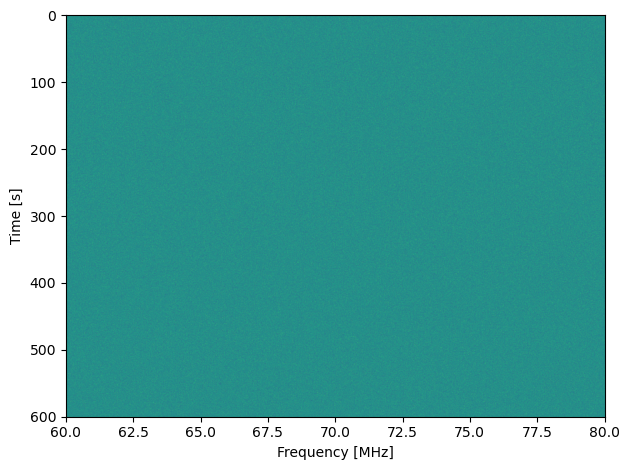

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


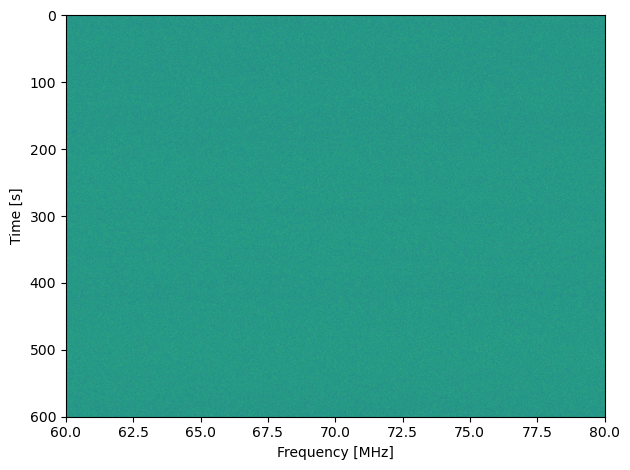

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


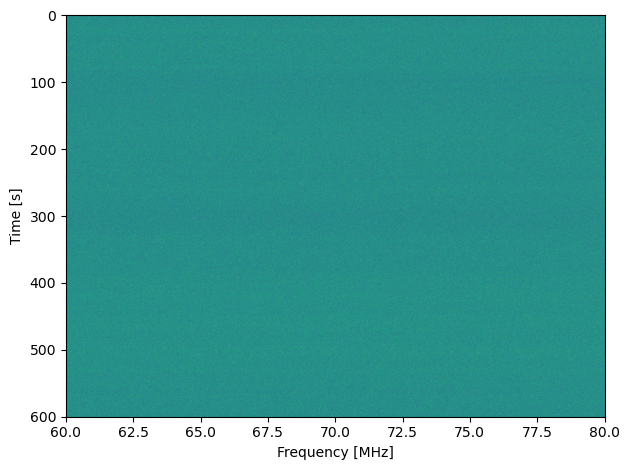

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


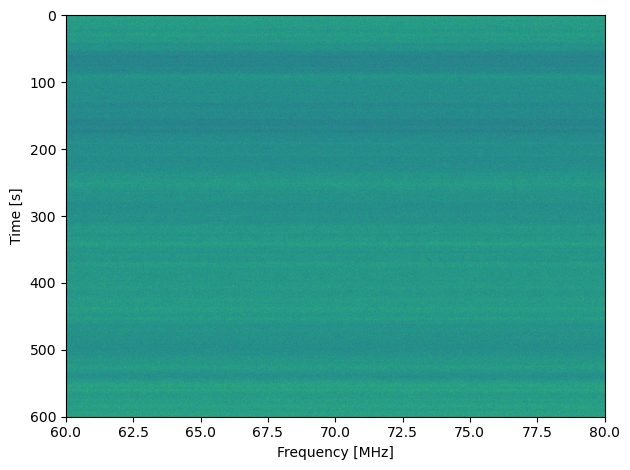

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra


In [5]:
f_k_list = [10, 50,100, 500]

#receiver = charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
#                                n_freq_channels=2**13, sample_rate=20e6,
#                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
#                                reflection_coefficients=0.5, window_function='Rectangular',
#                                beta=0)

receiver_list = [charger.SDR_Receiver(characteristic_frequency=f_k, alpha=2, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function='Rectangular',
                                beta=0) for f_k in f_k_list]

reference_load = charger.Source(temperatures=300, reflection_coefficients=0, frequencies=receiver_list[0].frequencies)

time_series_fk = []

for receiver in receiver_list:
    tod = charger.TimeStreamGenerator(integration_time=1, simulation_time=600,
                                          bandwidth=receiver.sample_rate, centre_frequency=receiver.centre_frequency,
                                          n_freq_channels=receiver.n_freq_channels)
    tod.generate_simulated_data(obs_source=reference_load, cw_source=None, receiver=receiver, save_data=False, switching=False, 
                                    power_meter=None, plot_spectra=True, save_into_object=True, return_list=False)
    time_series_fk.append(tod)

Window Function

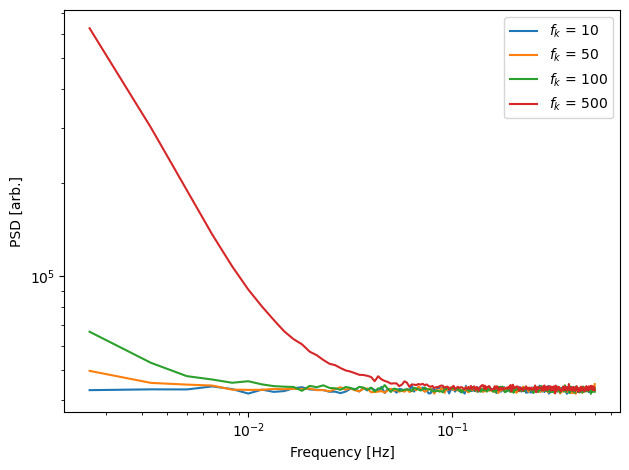

In [ ]:
fig, axes = plt.subplots()
for tod, f_k in zip(time_series_fk, f_k_list):
    psd_list = np.array([np.abs(np.fft.rfft(i))**2 for i in tod.integrated_spectra.T])
    avg_psd = np.mean(psd_list, axis=0)
    dt = tod.times[-1] / len(tod.times)
    psd_freqs = np.fft.rfftfreq(len(tod.integrated_spectra.T[0]), d=dt)
    axes.plot(psd_freqs[1:], avg_psd[1:], label=r'$f_k$ = ' + str(f_k)+' Hz')
axes.set_xscale('log')
axes.set_yscale('log')
axes.set_ylabel('PSD [arb.]')
axes.set_xlabel('Frequency [Hz]')
axes.legend()
fig.tight_layout()
fig.savefig('Plots/f_k_receiver_comparison.pdf')
plt.show()

Window Function Analysis

f_k set to 100 Hz for all cases.

   generating data


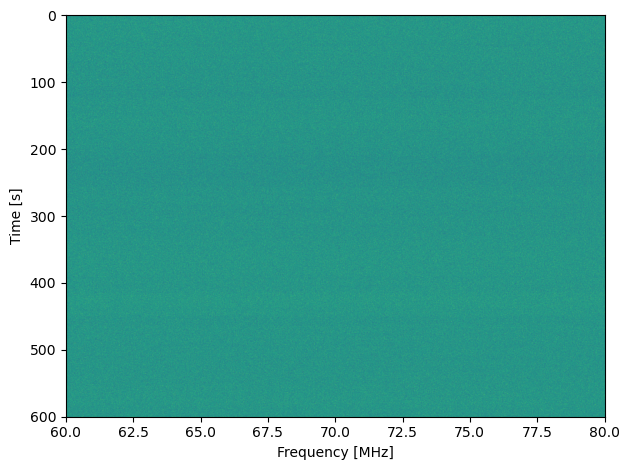

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


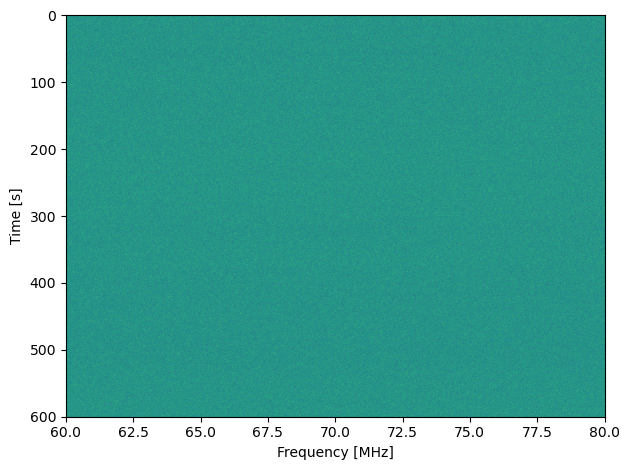

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


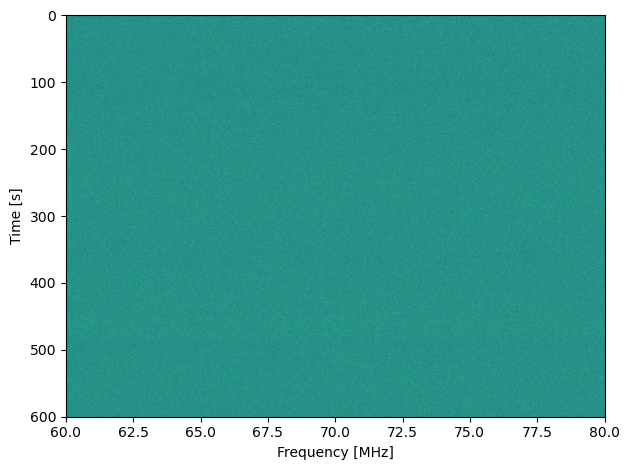

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


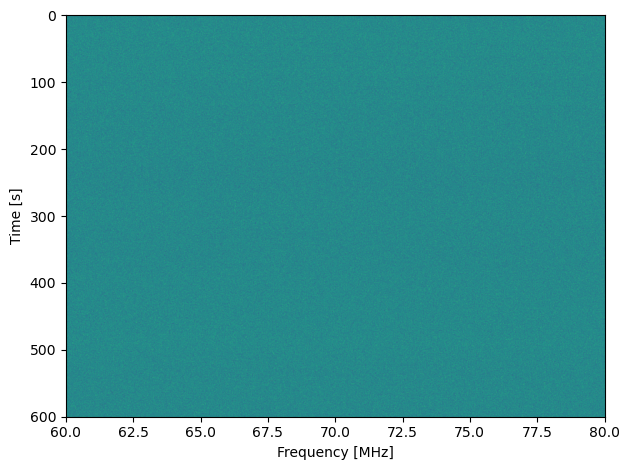

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


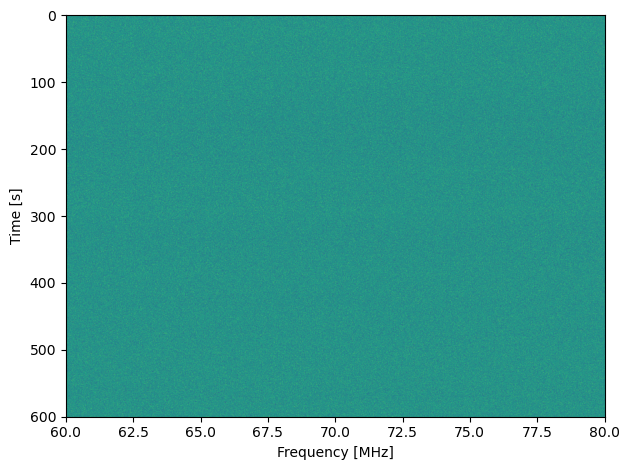

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra


In [8]:
window_func_list = ['Rectangular', 'Blackman', 'Bartlett', 'Hamming', 'Hanning']

#receiver = charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
#                                n_freq_channels=2**13, sample_rate=20e6,
#                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
#                                reflection_coefficients=0.5, window_function='Rectangular',
#                                beta=0)

window_receiver_list = [charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function=w,
                                beta=0) for w in window_func_list]

reference_load = charger.Source(temperatures=300, reflection_coefficients=0, frequencies=receiver_list[0].frequencies)

time_series_windows = []

for receiver in window_receiver_list:
    tod = charger.TimeStreamGenerator(integration_time=1, simulation_time=600,
                                          bandwidth=receiver.sample_rate, centre_frequency=receiver.centre_frequency,
                                          n_freq_channels=receiver.n_freq_channels)
    tod.generate_simulated_data(obs_source=reference_load, cw_source=None, receiver=receiver, save_data=False, switching=False, 
                                    power_meter=None, plot_spectra=True, save_into_object=True, return_list=False)
    time_series_windows.append(tod)



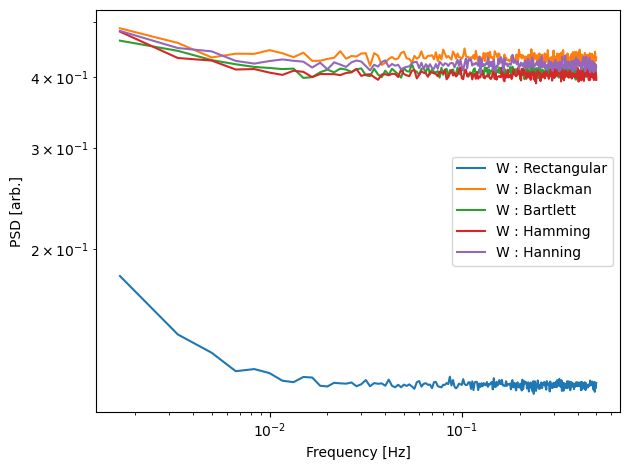

(8192, 8192)
(8192, 8192)
(8192, 8192)
(8192, 8192)
(8192, 8192)


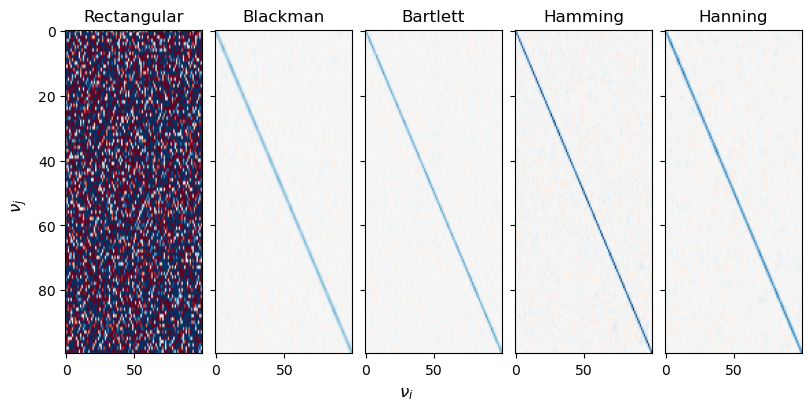

In [47]:
fig, axes = plt.subplots()
for tod, w in zip(time_series_windows, window_func_list):
    psd_list = np.array([np.abs(np.fft.rfft(i / np.mean(i)))**2 for i in tod.integrated_spectra.T])
    avg_psd = np.mean(psd_list, axis=0)
    dt = tod.times[-1] / len(tod.times)
    psd_freqs = np.fft.rfftfreq(len(tod.integrated_spectra.T[0]), d=dt)
    axes.plot(psd_freqs[1:], avg_psd[1:], label=r'W : ' + str(w))
axes.set_xscale('log')
axes.set_yscale('log')
axes.set_ylabel('PSD [arb.]')
axes.set_xlabel('Frequency [Hz]')
axes.legend()
fig.tight_layout()
fig.savefig('Plots/window_receiver_comparison.pdf')
plt.show()




corr_coef = [np.cov(s.integrated_spectra.T) for s in time_series_windows]
fig, axes = plt.subplots(ncols=len(corr_coef), layout='constrained', sharey=True, figsize=(8,4))

tester = np.abs(np.array(corr_coef))
vmin = np.min(10*np.log10(tester))
vmax = np.max(10*np.log10(tester))

vmin, vmax = -1, 1

for i, cov in enumerate(corr_coef):
    print(cov.shape)
    axes[i].imshow(cov[0:100, 0:100], aspect='auto', vmin=vmin, vmax=vmax, cmap='RdBu')
    axes[i].set_title(window_func_list[i])
fig.supxlabel(r'$\nu_i$')
fig.supylabel(r'$\nu_j$')

fig.savefig('Plots/window_covariance_comparison.pdf')
plt.show()


Example CW only Gain Calibration

   generating data


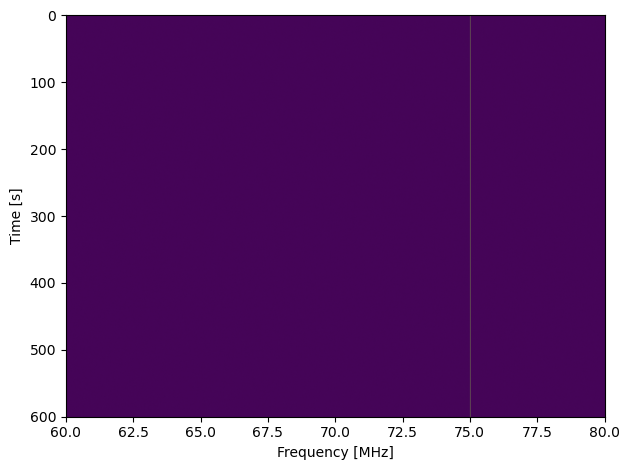

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra


In [16]:
receiver = charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function='Blackman',
                                beta=0)

reference_load = charger.Source(temperatures=300, reflection_coefficients=0, frequencies=receiver.frequencies)

cw_source = charger.CW_Source(initial_cw_amplitude=5e-1, oscilator_frequency=75e6,
                              characteristic_frequency=1e-3, alpha=2,
                              phase_white_noise=1e-9, phase_knee_frequency=1e-6, phase_alpha=2)

tod = charger.TimeStreamGenerator(integration_time=1, simulation_time=600,
                                  bandwidth=receiver.sample_rate,
                                  centre_frequency=receiver.centre_frequency,
                                    n_freq_channels=receiver.n_freq_channels)
tod.generate_simulated_data(obs_source=reference_load, cw_source=cw_source, receiver=receiver, save_data=False, switching=False,
                            power_meter=None, plot_spectra=True, save_into_object=True, return_list=False)


(600, 8192)
(600, 8192)


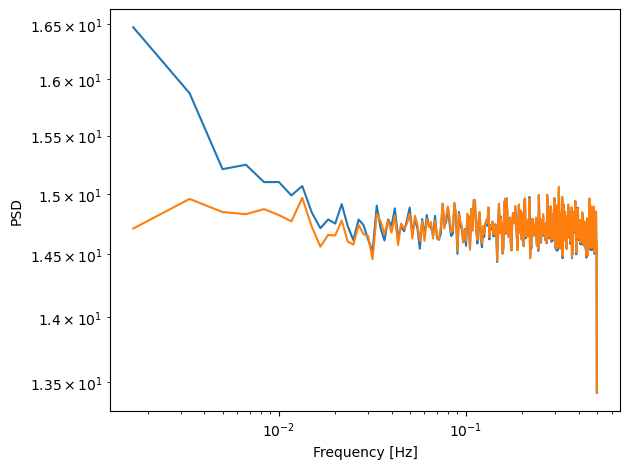

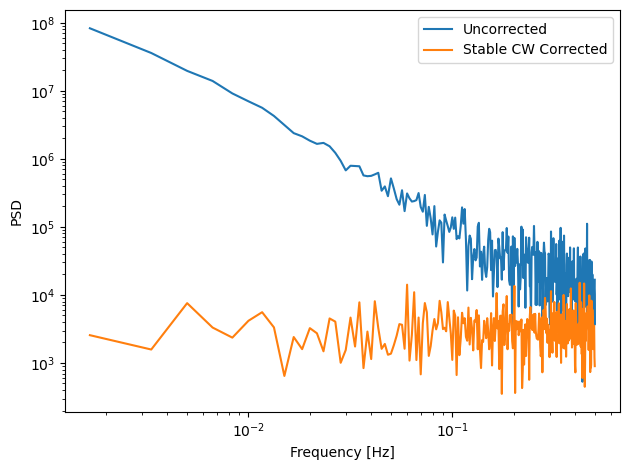

In [42]:
orignal_spectra = tod.integrated_spectra

def linear():
    pass

class CW_Calibrator:
    def __init__(self, spectra, times, frequencies, pm_powers=None):
        self.spectra = spectra
        self.times = times
        self.frequencies = frequencies
        pass

    def include_power_meter(self, power_meter_measurements, pm_power_func=linear, pm_params=[1,1], pm_zero_measurement=1):
        pm_zero_pwr = pm_power_func(pm_zero_measurement, pm_params)
        pm_pwrs = pm_power_func(power_meter_measurements, pm_params)

        self.pm_y = (pm_pwrs - pm_zero_pwr) / (pm_pwrs[0] - pm_zero_pwr)


    def aperture_cw_isolation(self, s, aperture_bounds, return_cw_index=False):
        n_cw_side_channels, n_non_cw_channels = aperture_bounds
        cw_index = np.argmax(s)
        non_cw_lower_mean = np.mean(s[cw_index-1-n_non_cw_channels-n_cw_side_channels : cw_index-1-n_cw_side_channels])
        non_cw_upper_mean = np.mean(s[cw_index+1+n_cw_side_channels : cw_index+1+n_non_cw_channels+n_cw_side_channels:])
        non_cw_mean = (non_cw_lower_mean + non_cw_upper_mean) / 2

        cw_channels = s[cw_index-n_cw_side_channels:cw_index+n_cw_side_channels]
        cw_pwr = np.sum(cw_channels) - non_cw_mean * len(cw_channels)
        if return_cw_index:
            return cw_pwr, cw_index
        else:
            return cw_pwr
        

    def polynomial_fit_cw_isolation(self, s, polynomial_params, return_cw_index=False):
        order, n_cw_side_channels, n_fitting_channels = polynomial_params
        cw_index = np.argmax(s)
        non_cw_channels_lower = np.arange(start=cw_index - n_cw_side_channels-1-int(n_fitting_channels/2), 
                                          stop=cw_index - n_cw_side_channels-1)
        non_cw_channels_upper = np.arange(start=cw_index + n_cw_side_channels+1, 
                                          stop=cw_index + n_cw_side_channels+1+int(n_fitting_channels/2))
        non_cw_indices = [int(i) for i in np.concatenate(non_cw_channels_lower, non_cw_channels_upper)]
        non_cw_pwrs = s[non_cw_indices]
        cw_indices = np.arange(start=cw_index - n_cw_side_channels,
                               stop=cw_index + n_cw_side_channels)        

        poly_fitted = np.poly1d(np.polyfit(non_cw_indices, non_cw_pwrs, deg=order))

        cw_ch_powers = s[cw_indices] - poly_fitted(cw_indices)

        cw_pwr = np.sum(cw_ch_powers)

        if return_cw_index:
            return cw_pwr, cw_index
        else:
            return cw_pwr
    


    def otf_gain_calibration(self, method='Aperture', aperture_bounds=[2, 3], polynomial_params=[3, 3, 20]):
        if method == 'Aperture' or method == 'Ap':
            delta_p_cw = np.array([self.aperture_cw_isolation(s, aperture_bounds) for s in self.spectra])
        elif method == 'Polynomial' or method == 'Poly':
            delta_p_cw = np.array([self.polynomial_fit_cw_isolation(s, polynomial_params) for s in self.spectra])

        if self.pm_y is not None:
            gains = delta_p_cw / (delta_p_cw[0] * self.pm_y)
        else:
            gains =  delta_p_cw / delta_p_cw[0]

        self.gain_corrected_spectras = self.spectra.T / gains
        self.gain_corrected_spectras = self.gain_corrected_spectras.T

        print(self.gain_corrected_spectras.shape)
        print(self.spectra.shape)
        return self.gain_corrected_spectras
    
    def compare_pink_noise_before_and_after(self, n_to_mask=2):
        cw_indices = [self.aperture_cw_isolation(s, return_cw_index=True, aperture_bounds=[1,1])[1] for s in self.spectra]
        mask = np.ones(shape=self.gain_corrected_spectras.shape) # create a range of values for the mask based on the min and max of the cw indices, collapse into just frequency

        min_max_cw_indices = [int(np.min(cw_indices)) - n_to_mask, int(np.max(cw_indices)) + n_to_mask]
        mask_indices = np.arange(len(self.frequencies))[min_max_cw_indices[0]:min_max_cw_indices[1]]
        
        gain_corrected_psd_list = []
        for nu, tod in enumerate(self.gain_corrected_spectras.T):
            if nu in mask_indices:
                pass
            else:
                psd = np.abs(np.fft.rfft(tod))
                gain_corrected_psd_list.append(psd)

        gain_corrected_psd = np.mean(np.array(gain_corrected_psd_list), axis=0)

        original_psd_list = []
        for nu, tod in enumerate(self.spectra.T):
            if nu in mask_indices:
                pass
            else:
                psd = np.abs(np.fft.rfft(tod))
                original_psd_list.append(psd)
        original_psd = np.mean(np.array(original_psd_list), axis=0)
        
        fft_freqs = np.fft.rfftfreq(n=len(self.spectra.T[0]), d=self.times[-1] / len(self.times))
        plt.plot(fft_freqs[1:], original_psd[1:], label='Original')
        plt.plot(fft_freqs[1:], gain_corrected_psd[1:], label='Gain Corrected')
        plt.xlabel('Frequency [Hz]')
        plt.ylabel('PSD')
        plt.yscale('log')
        plt.xscale('log')
        plt.tight_layout()
        plt.show()


calibrator = CW_Calibrator(tod.integrated_spectra, tod.times, tod.frequencies_mhz)
calibrator.pm_y = None

corrected_spectra = calibrator.otf_gain_calibration(method='Aperture', aperture_bounds=[3,2])
calibrator.compare_pink_noise_before_and_after()

dt = tod.times[-1] / len(tod.integrated_spectra.T[0])

orignal_psd = np.mean(np.array([np.abs(np.fft.rfft(i))**2 for i in tod.integrated_spectra.T]), axis=0)
corrected_psd = np.mean(np.array([np.abs(np.fft.rfft(i))**2 for i in corrected_spectra.T]), axis=0)
psd_freqs = np.fft.rfftfreq(len(tod.integrated_spectra.T[0]), d=dt)

plt.plot(psd_freqs[1:], orignal_psd[1:], label='Uncorrected')
plt.plot(psd_freqs[1:], corrected_psd[1:], label='Stable CW Corrected')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.ylabel('PSD')
plt.xlabel('Frequency [Hz]')
plt.tight_layout()
plt.show()

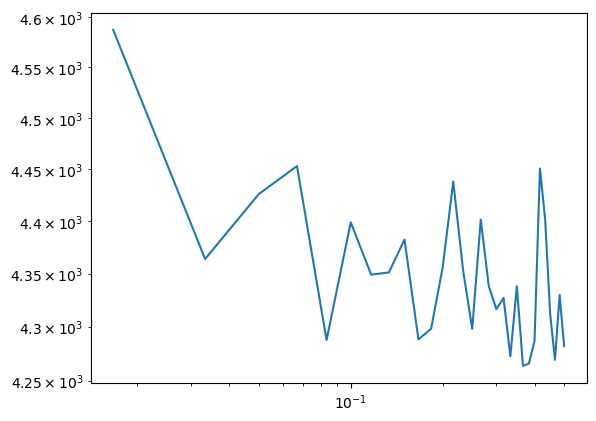

In [12]:
psd_list = []

psd_list = np.array([np.abs(np.fft.rfft(tod))**2 for tod in time_series.integrated_spectra.T])
avg_psd = np.mean(psd_list, axis=0)
dt = time_series.times[-1] / len(time_series.times)
psd_freqs = np.fft.rfftfreq(len(time_series.integrated_spectra.T[0]), d=dt)

plt.plot(psd_freqs[1:], avg_psd[1:])
plt.yscale('log')
plt.xscale('log')
plt.show()


Analysis of CW amplitudes and the saturation point for the rectangular filter.

   generating data


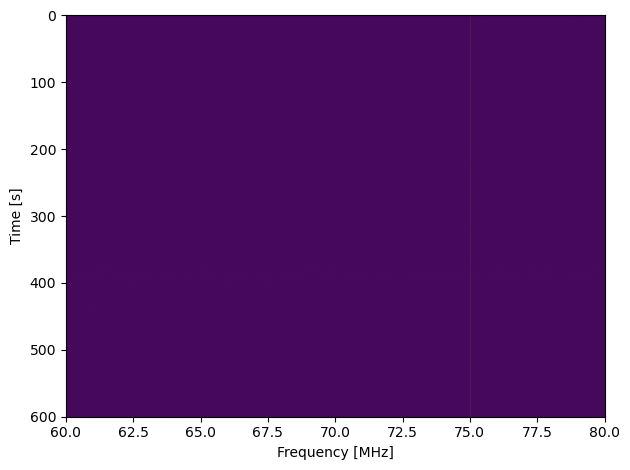

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


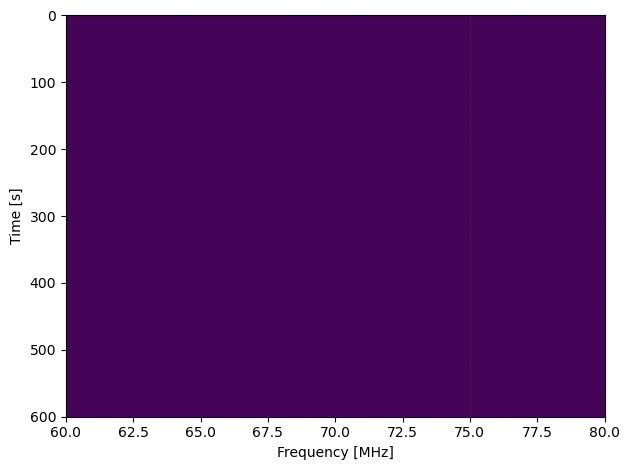

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


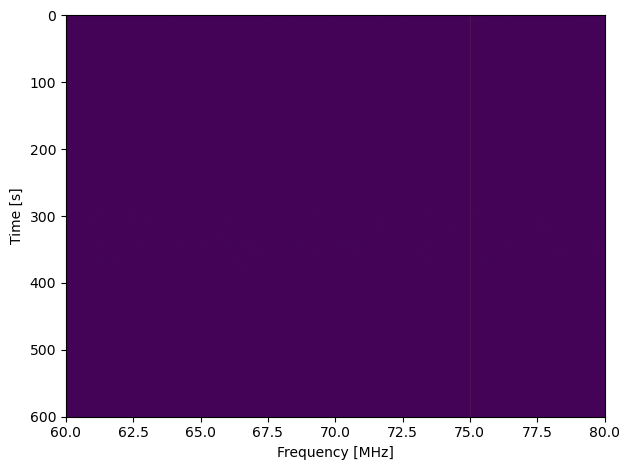

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


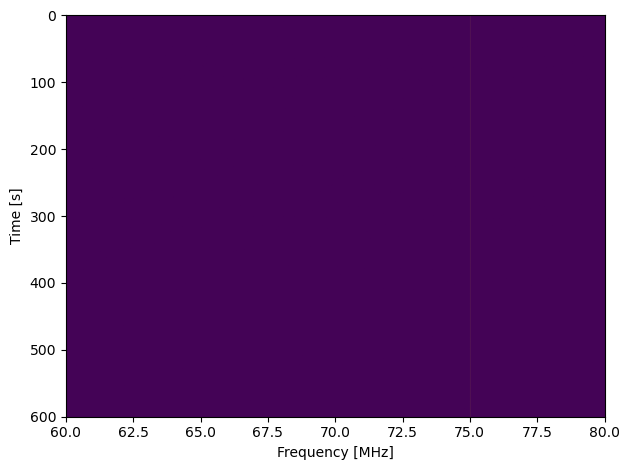

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


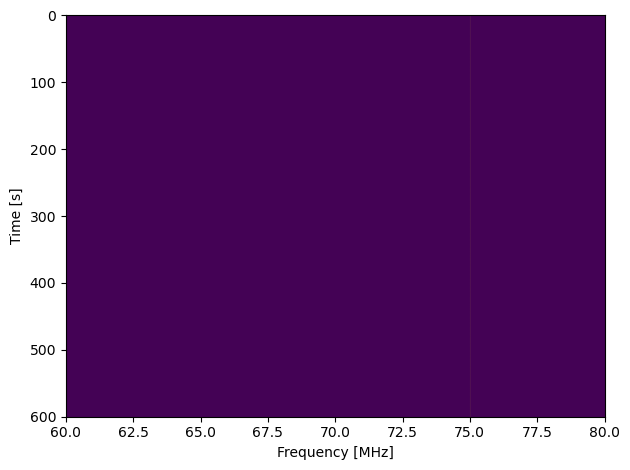

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


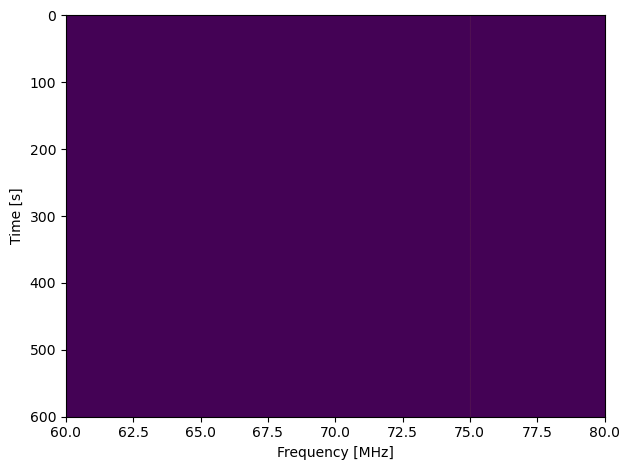

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra


In [48]:
receiver = charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function='Rectangular',
                                beta=0)

reference_load = charger.Source(temperatures=300, reflection_coefficients=0, frequencies=receiver.frequencies)

a_cws = [1e-2, 5e-2, 1e-1, 5e-1, 1, 2] 

cw_sources = [charger.CW_Source(initial_cw_amplitude=a_cw, oscilator_frequency=75e6,
                              characteristic_frequency=1, alpha=2,
                              phase_white_noise=1e-9, phase_knee_frequency=1e-6, phase_alpha=2) for a_cw in a_cws]

a_cws_tods = []

for cw_s in cw_sources:
    t = charger.TimeStreamGenerator(integration_time=1, simulation_time=600,
                                    bandwidth=receiver.sample_rate,
                                    centre_frequency=receiver.centre_frequency,
                                    n_freq_channels=receiver.n_freq_channels)
    t.generate_simulated_data(obs_source=reference_load, cw_source=cw_s, receiver=receiver, save_data=False, switching=False,
                                power_meter=None, plot_spectra=True, save_into_object=True, return_list=False)
    
    a_cws_tods.append(t)

6144


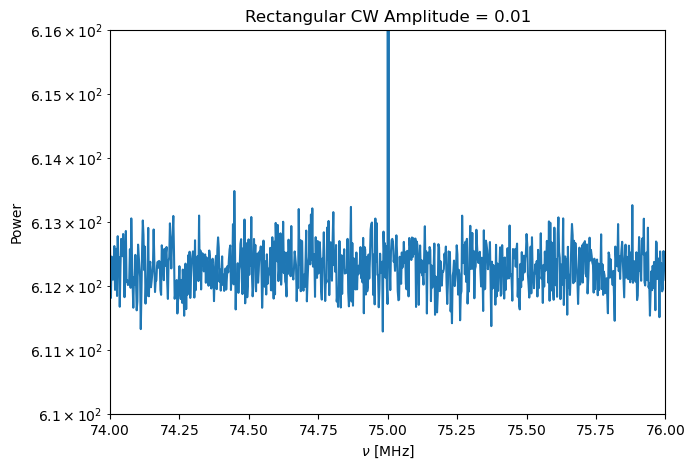

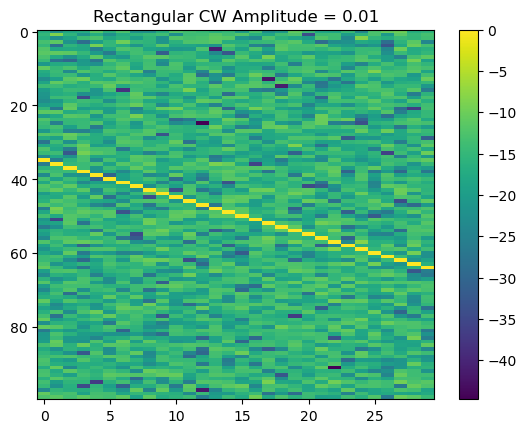

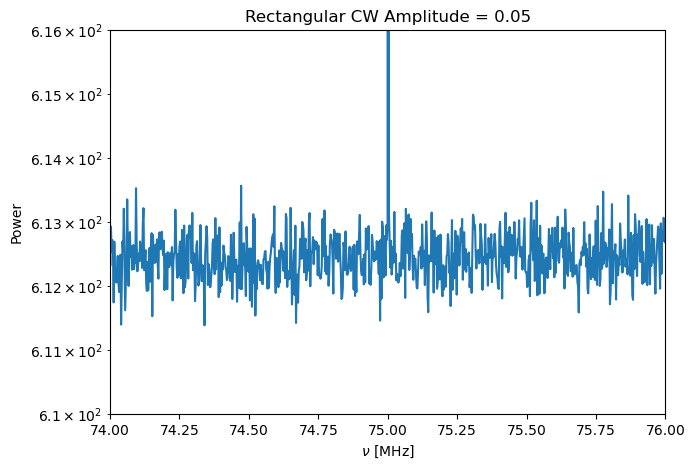

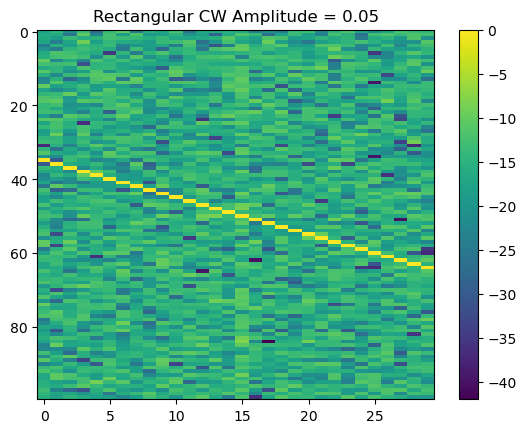

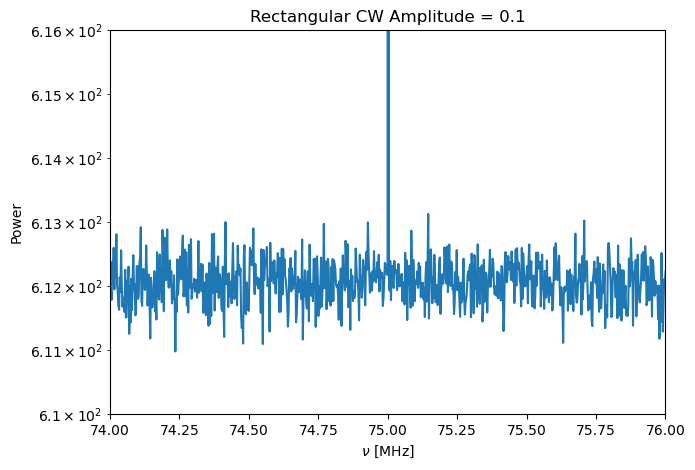

...

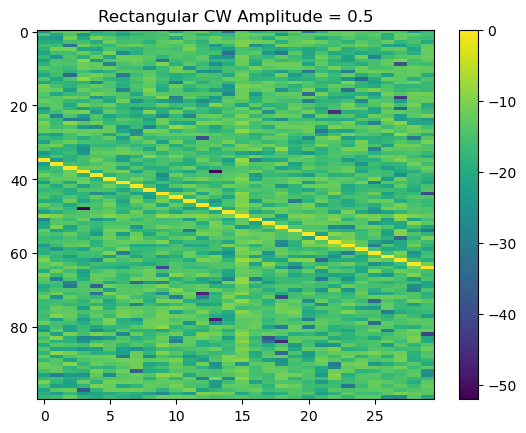

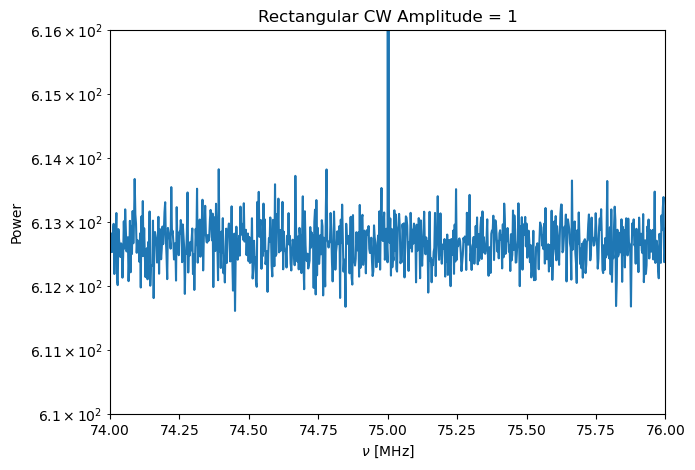

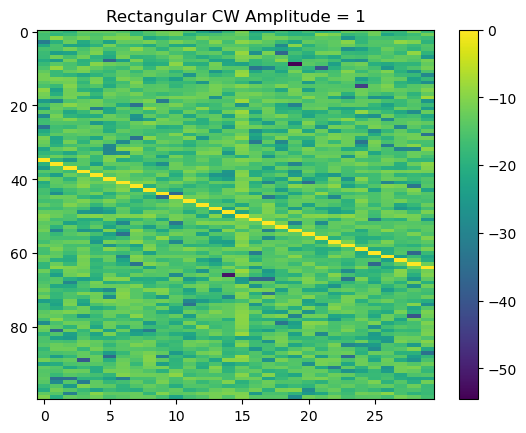

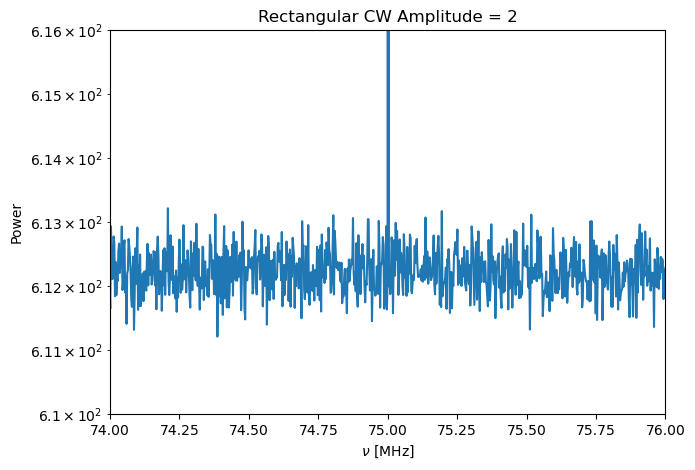

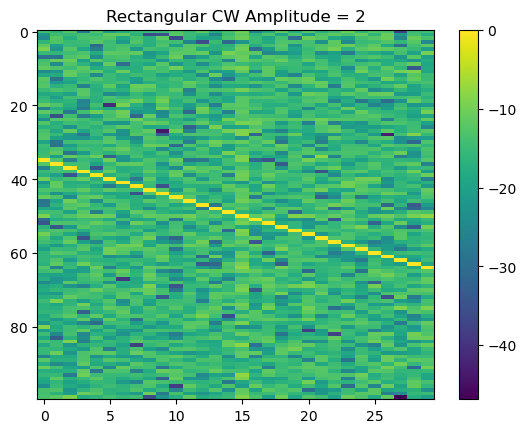

In [87]:
_spectra = a_cws_tods[0].integrated_spectra
cw_index = np.argmax(_spectra[0])
print(cw_index)

for a_cw, t in zip(a_cws, a_cws_tods):
    mean = np.mean(t.integrated_spectra, axis=0)
    plt.plot(t.frequencies_mhz, mean)
    plt.xlabel(r'$\nu$ [MHz]')
    plt.ylabel('Power')
    plt.yscale('log')
    plt.title(f'Rectangular CW Amplitude = {a_cw}')
    plt.tight_layout()
    plt.ylim(top=616, bottom=610)
    plt.xlim(74, 76)
    plt.show()

    cov = 10*np.log10(np.abs(np.corrcoef(t.integrated_spectra.T)))
    
    plt.imshow(cov[cw_index-50:cw_index+50, cw_index-15:cw_index+15], aspect='auto')
    plt.title(f'Rectangular CW Amplitude = {a_cw}')
    plt.colorbar()
    plt.show()

   generating data


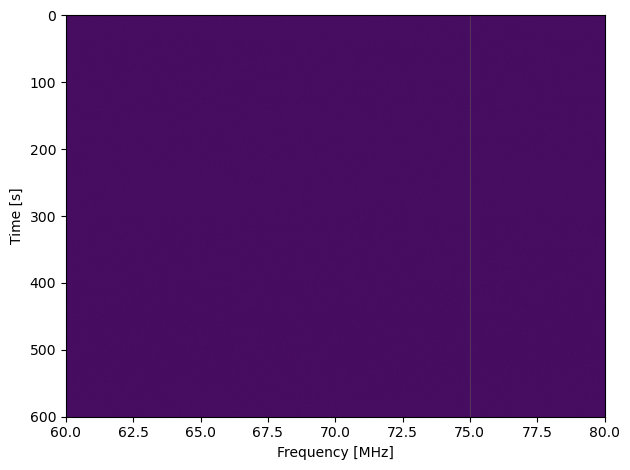

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


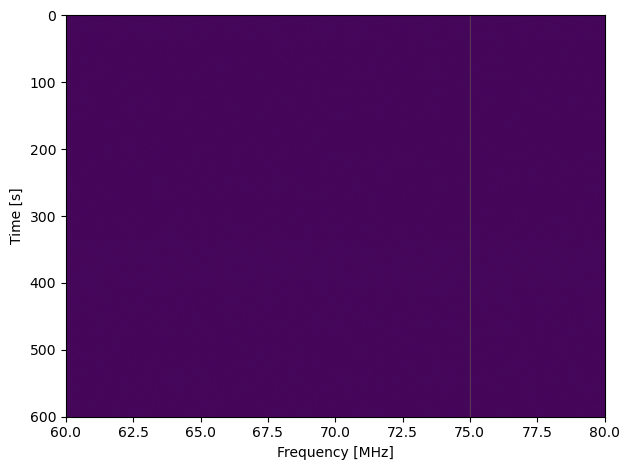

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


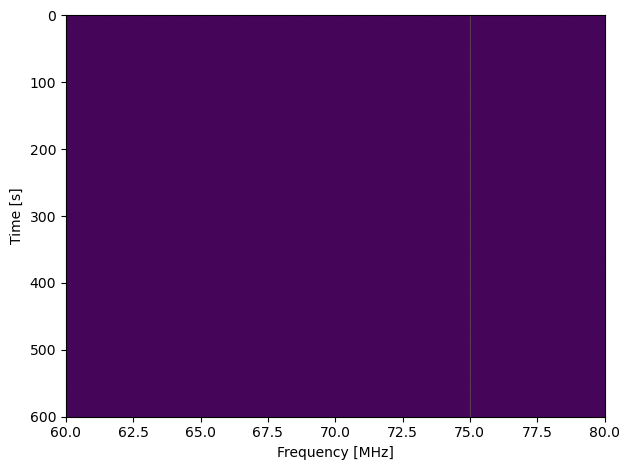

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


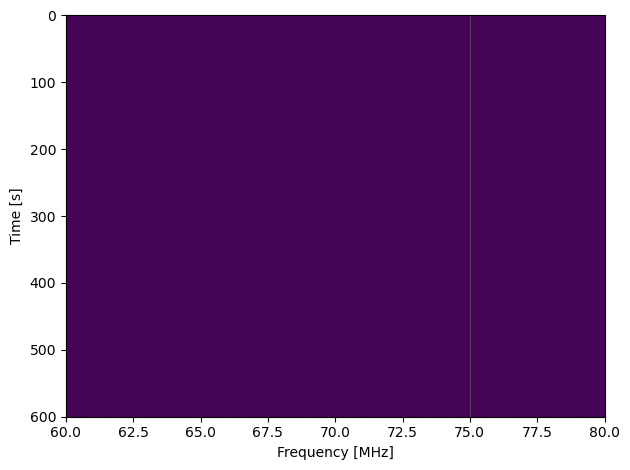

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


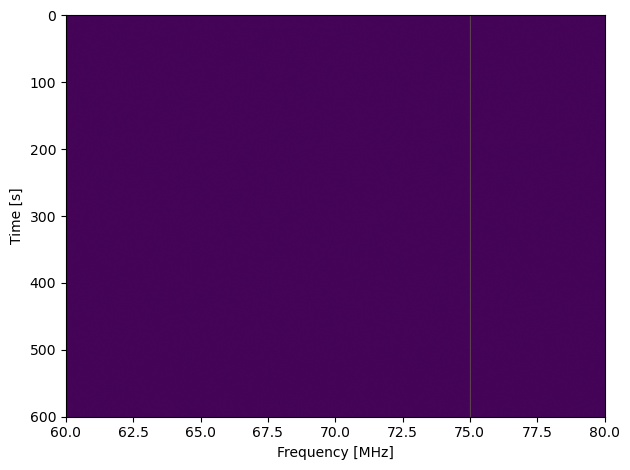

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


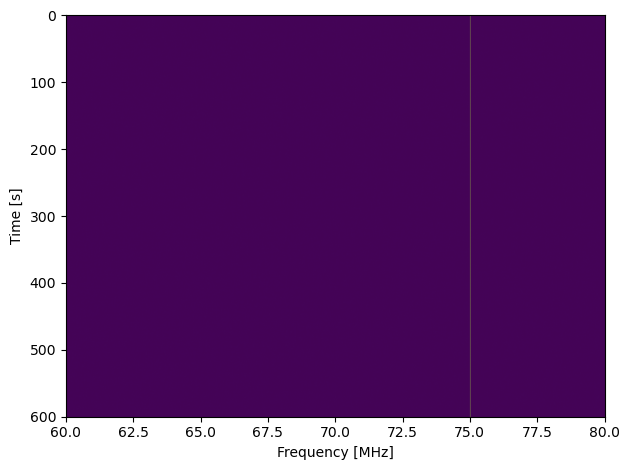

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra


In [56]:
receiver = charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function='Blackman',
                                beta=0)

reference_load = charger.Source(temperatures=300, reflection_coefficients=0, frequencies=receiver.frequencies)

a_cws = [1e-2, 5e-2, 1e-1, 5e-1, 1, 2] 

cw_sources = [charger.CW_Source(initial_cw_amplitude=a_cw, oscilator_frequency=75e6,
                              characteristic_frequency=1, alpha=2,
                              phase_white_noise=1e-9, phase_knee_frequency=1e-6, phase_alpha=2) for a_cw in a_cws]

a_cws_tods_blackman = []

for cw_s in cw_sources:
    t = charger.TimeStreamGenerator(integration_time=1, simulation_time=600,
                                    bandwidth=receiver.sample_rate,
                                    centre_frequency=receiver.centre_frequency,
                                    n_freq_channels=receiver.n_freq_channels)
    t.generate_simulated_data(obs_source=reference_load, cw_source=cw_s, receiver=receiver, save_data=False, switching=False,
                                power_meter=None, plot_spectra=True, save_into_object=True, return_list=False)
    
    a_cws_tods_blackman.append(t)

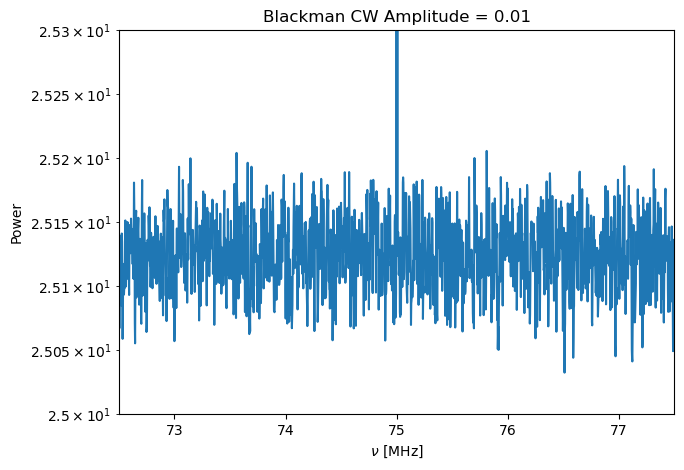

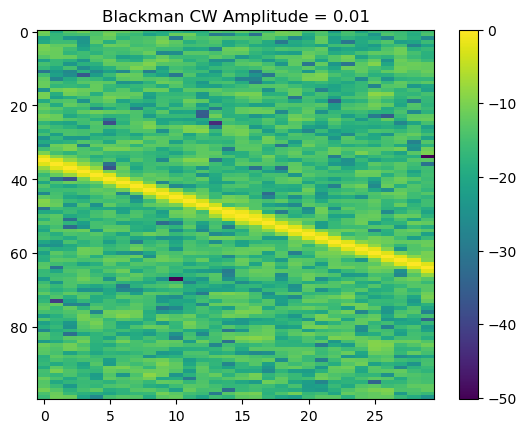

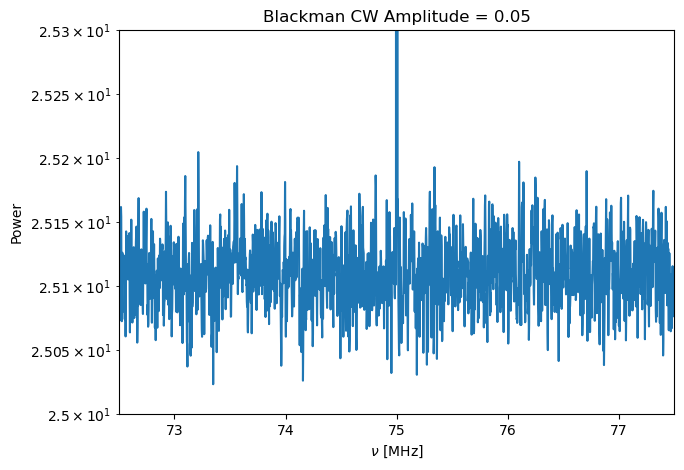

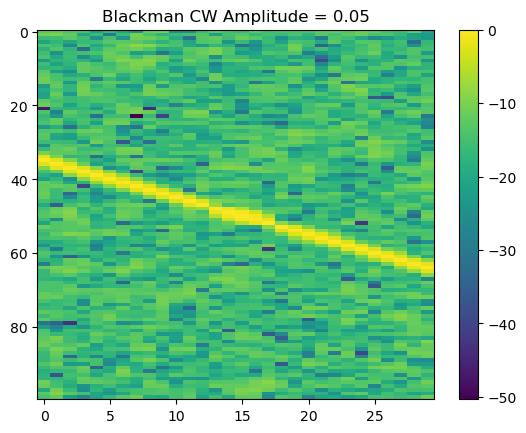

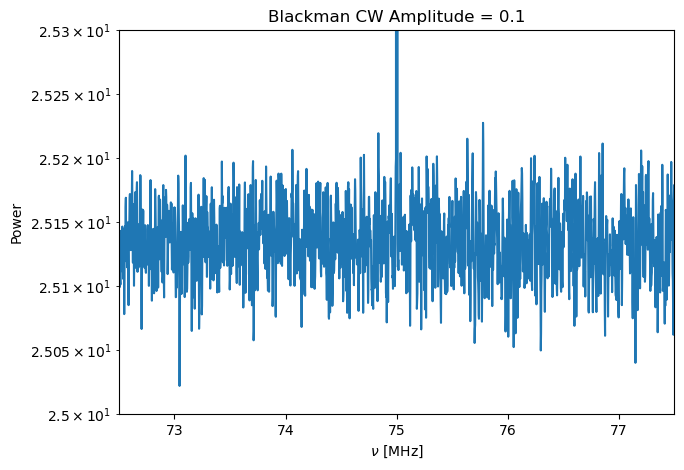

...

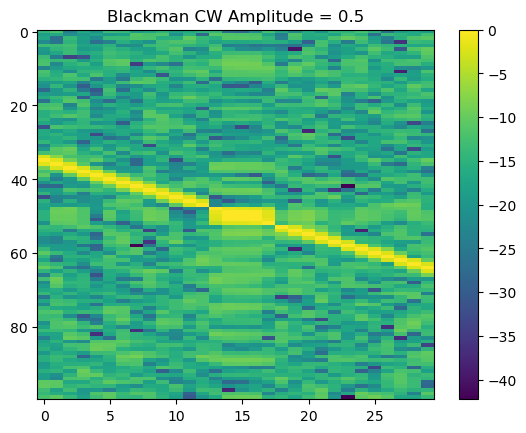

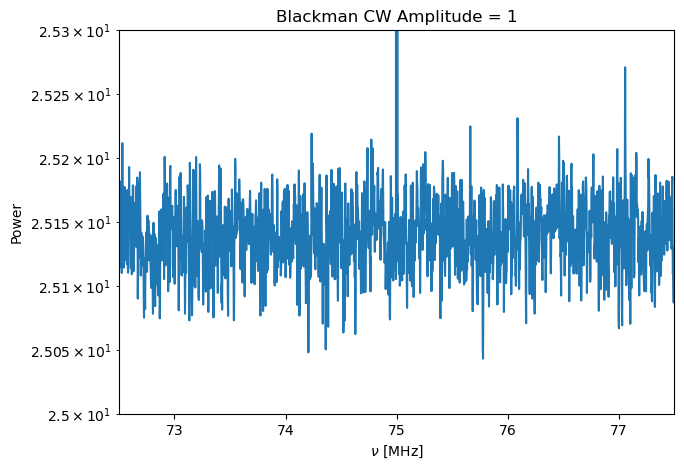

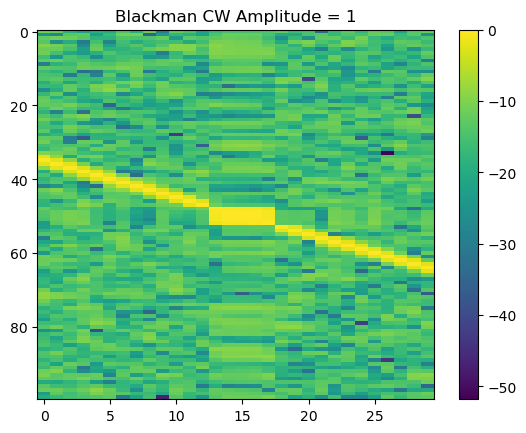

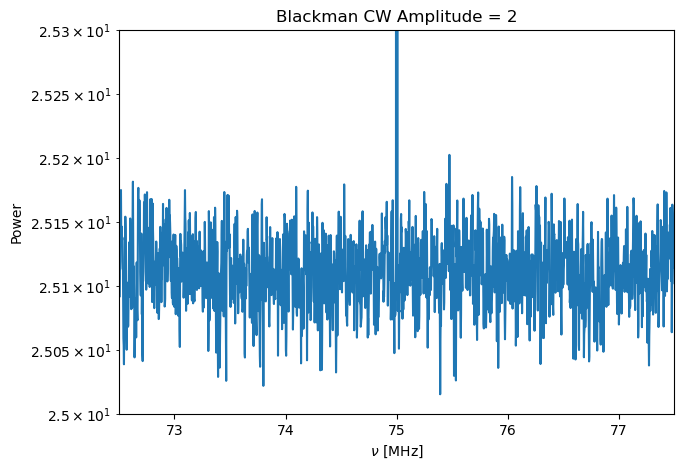

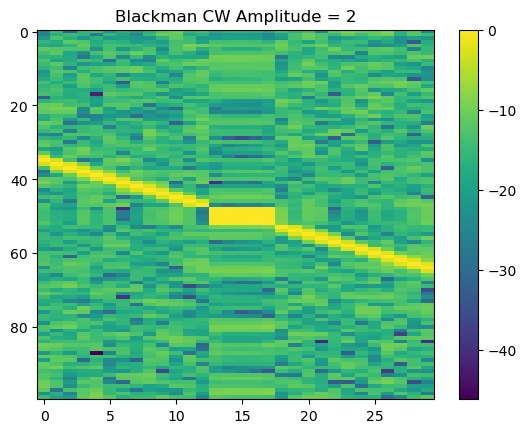

In [86]:
for a_cw, t in zip(a_cws, a_cws_tods_blackman):
    mean = np.mean(t.integrated_spectra, axis=0)
    plt.plot(t.frequencies_mhz, mean)
    plt.xlabel(r'$\nu$ [MHz]')
    plt.ylabel('Power')
    plt.yscale('log')
    plt.title(f'Blackman CW Amplitude = {a_cw}')
    plt.xlim(72.5, 77.5)
    plt.tight_layout()
    plt.ylim(top=25.3, bottom=25)
    plt.show()

    cov = 10*np.log10(np.abs(np.corrcoef(t.integrated_spectra.T)))
    
    plt.imshow(cov[cw_index-50:cw_index+50, cw_index-15:cw_index+15], aspect='auto')
    plt.title(f'Blackman CW Amplitude = {a_cw}')
    plt.colorbar()
    plt.show()

Reanalysis But with a larger signal.

In [3]:
receiver = charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function='Rectangular',
                                beta=0)

reference_load = charger.Source(temperatures=300, reflection_coefficients=0, frequencies=receiver.frequencies)

a_cws = [1, 5, 10, 50, 100] 

cw_sources = [charger.CW_Source(initial_cw_amplitude=a_cw, oscilator_frequency=75e6,
                              characteristic_frequency=1, alpha=2,
                              phase_white_noise=1e-9, phase_knee_frequency=1e-6, phase_alpha=2) for a_cw in a_cws]

a_cws_tods_rectangular_window = []

for cw_s in cw_sources:
    t = charger.TimeStreamGenerator(integration_time=1, simulation_time=600,
                                    bandwidth=receiver.sample_rate,
                                    centre_frequency=receiver.centre_frequency,
                                    n_freq_channels=receiver.n_freq_channels)
    t.generate_simulated_data(obs_source=reference_load, cw_source=cw_s, receiver=receiver, save_data=False, switching=False,
                                power_meter=None, plot_spectra=False, save_into_object=True, return_list=False)
    
    a_cws_tods_rectangular_window.append(t)

receiver = charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function='Blackman',
                                beta=0)

reference_load = charger.Source(temperatures=300, reflection_coefficients=0, frequencies=receiver.frequencies)

a_cws = [1, 5, 10, 50, 100]

cw_sources = [charger.CW_Source(initial_cw_amplitude=a_cw, oscilator_frequency=75e6,
                              characteristic_frequency=1, alpha=2,
                              phase_white_noise=1e-9, phase_knee_frequency=1e-6, phase_alpha=2) for a_cw in a_cws]

a_cws_tods_blackman_window = []

for cw_s in cw_sources:
    t = charger.TimeStreamGenerator(integration_time=1, simulation_time=600,
                                    bandwidth=receiver.sample_rate,
                                    centre_frequency=receiver.centre_frequency,
                                    n_freq_channels=receiver.n_freq_channels)
    t.generate_simulated_data(obs_source=reference_load, cw_source=cw_s, receiver=receiver, save_data=False, switching=False,
                                power_meter=None, plot_spectra=False, save_into_object=True, return_list=False)
    
    a_cws_tods_blackman_window.append(t)

   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating da

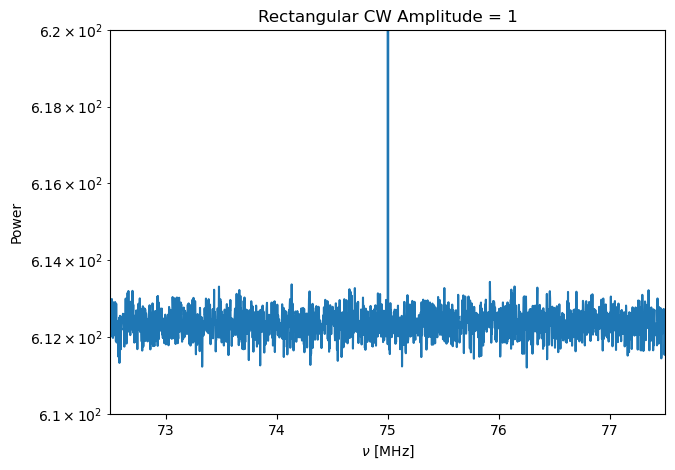

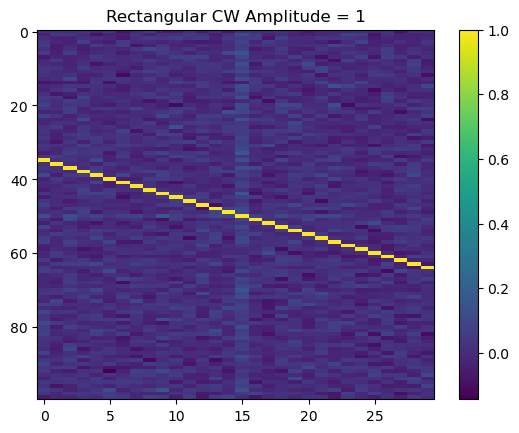

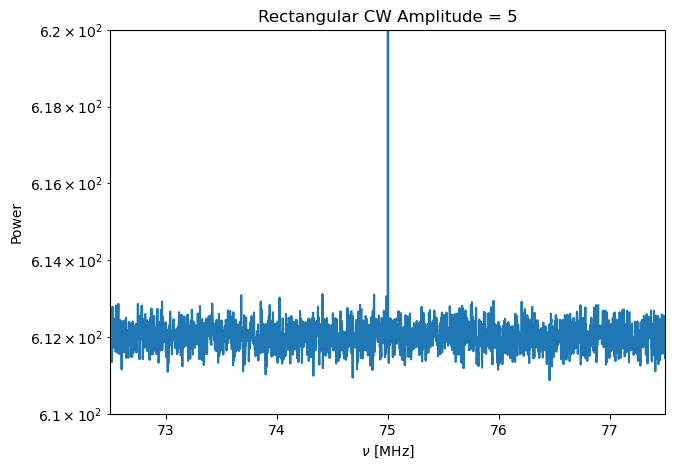

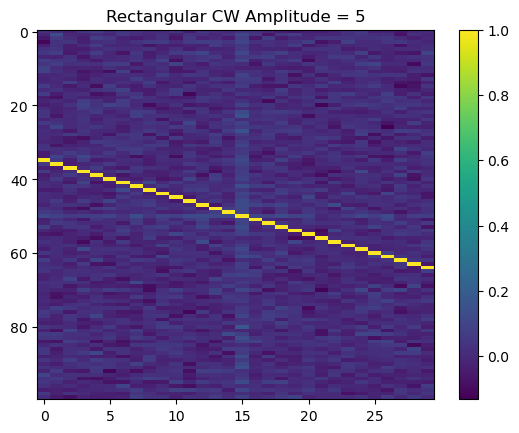

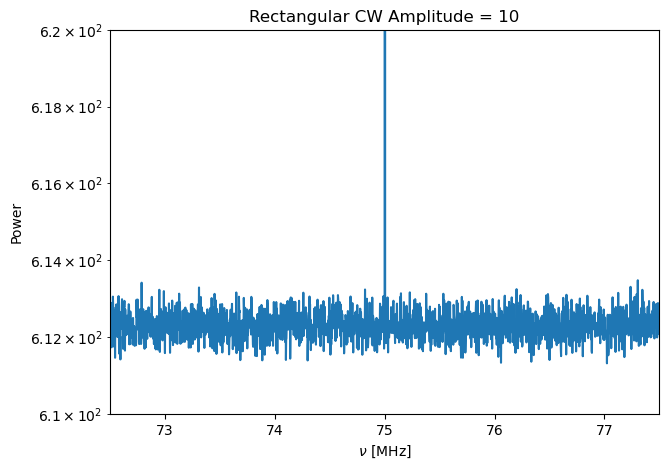

...

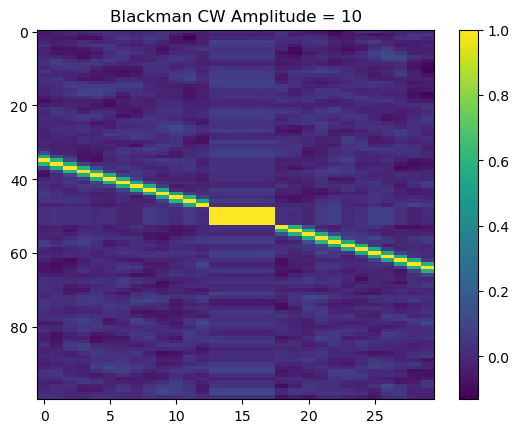

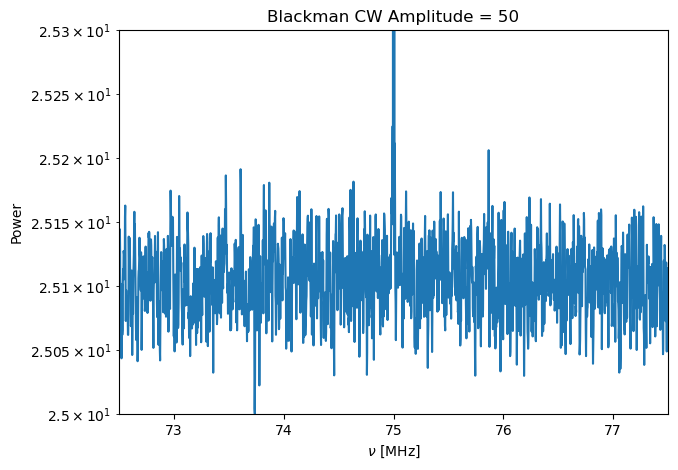

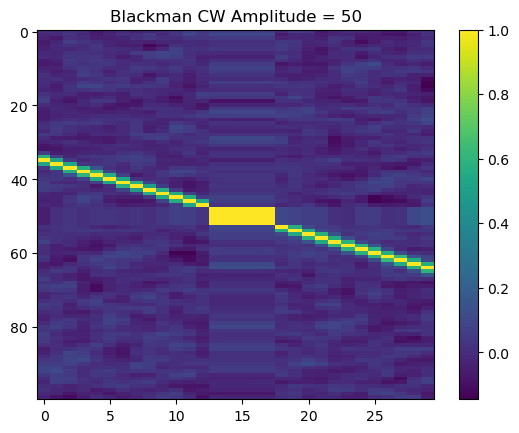

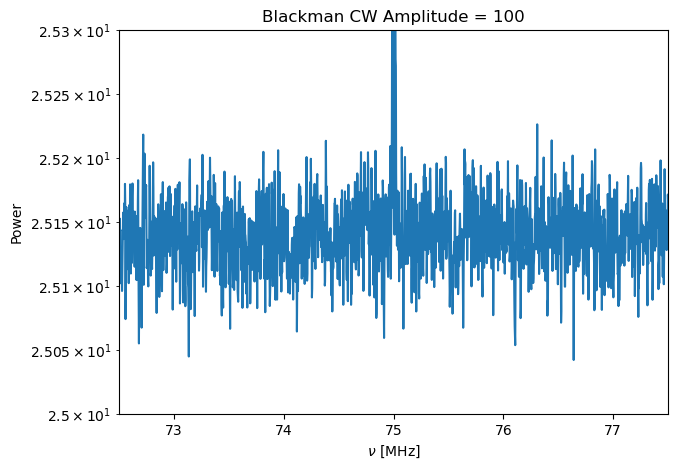

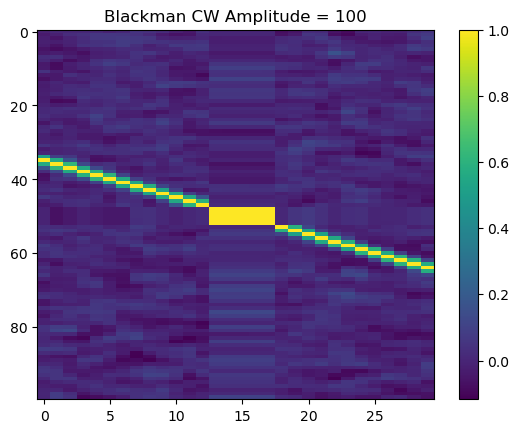

In [92]:
for a_cw, t in zip(a_cws, a_cws_tods_rectangular_window):
    mean = np.mean(t.integrated_spectra, axis=0)
    plt.plot(t.frequencies_mhz, mean)
    plt.xlabel(r'$\nu$ [MHz]')
    plt.ylabel('Power')
    plt.yscale('log')
    plt.title(f'Rectangular CW Amplitude = {a_cw}')
    plt.xlim(72.5, 77.5)
    plt.tight_layout()
    plt.ylim(top=620, bottom=610)
    plt.show()

    cov = np.corrcoef(t.integrated_spectra.T)
    
    plt.imshow(cov[cw_index-50:cw_index+50, cw_index-15:cw_index+15], aspect='auto')
    plt.title(f'Rectangular CW Amplitude = {a_cw}')
    plt.colorbar()
    plt.show()

for a_cw, t in zip(a_cws, a_cws_tods_blackman_window):
    mean = np.mean(t.integrated_spectra, axis=0)
    plt.plot(t.frequencies_mhz, mean)
    plt.xlabel(r'$\nu$ [MHz]')
    plt.ylabel('Power')
    plt.yscale('log')
    plt.title(f'Blackman CW Amplitude = {a_cw}')
    plt.xlim(72.5, 77.5)
    plt.tight_layout()
    plt.ylim(top=25.3, bottom=25)
    plt.show()

    cov = np.corrcoef(t.integrated_spectra.T)
    
    plt.imshow(cov[cw_index-50:cw_index+50, cw_index-15:cw_index+15], aspect='auto')
    plt.title(f'Blackman CW Amplitude = {a_cw}')
    plt.colorbar()
    plt.show()

Comparison of Covariances of other channels. 

6144


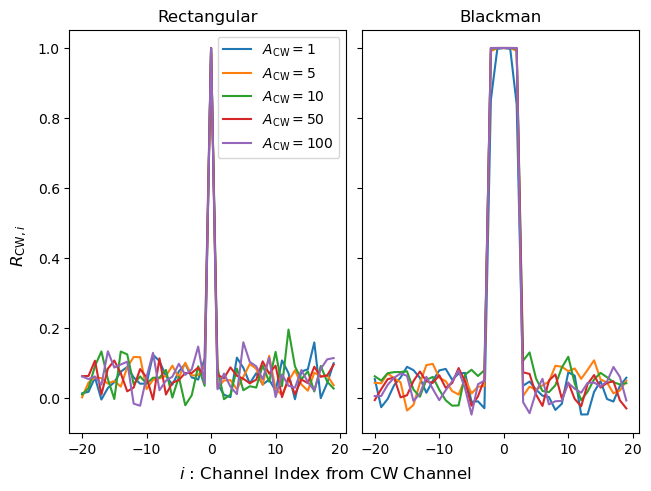

In [80]:
_spectra = a_cws_tods_rectangular_window[0].integrated_spectra
cw_index = np.argmax(_spectra[0])
print(cw_index)

fig, axes = plt.subplots(ncols=2, sharey=True, layout='constrained')
bounds = 20
for a_cw, t in zip(a_cws, a_cws_tods_blackman_window):
    cov = np.corrcoef(t.integrated_spectra.T)
    cov_slice = cov[cw_index]
    axes[1].plot(np.arange(start=-bounds, stop=bounds),
                 cov_slice[cw_index-bounds:cw_index+bounds], label=r'$A_{\rm CW} = $'+str(a_cw))
    pass

for a_cw, t in zip(a_cws, a_cws_tods_rectangular_window):
    cov = np.corrcoef(t.integrated_spectra.T)
    cov_slice = cov[cw_index]
    axes[0].plot(np.arange(start=-bounds, stop=bounds),
                 cov_slice[cw_index-bounds:cw_index+bounds], label=r'$A_{\rm CW} = $'+str(a_cw))
    pass

axes[0].legend()
axes[0].set_title('Rectangular')
axes[1].set_title('Blackman')

fig.supxlabel(r'$i$ : Channel Index from CW Channel')
fig.supylabel(r'$R_{{\rm CW}, i}$')
fig.savefig('Plots/BlackmanRectangularCorrCoeffComparisonCWAmplitude.pdf')
plt.show()

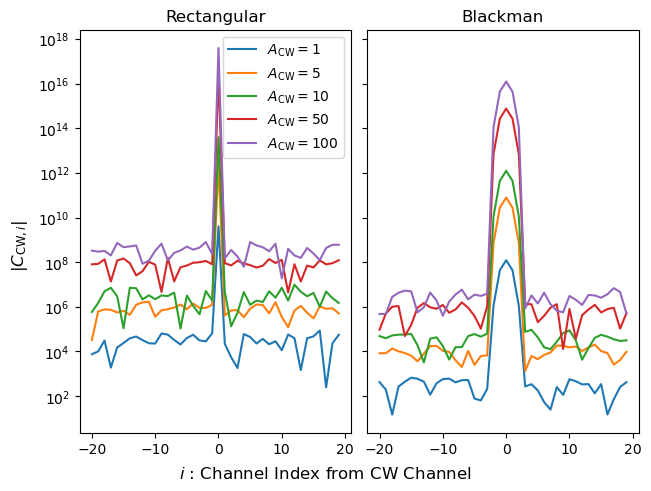

In [81]:
fig, axes = plt.subplots(ncols=2, sharey=True, layout='constrained')
for a_cw, t in zip(a_cws, a_cws_tods_blackman_window):
    cov = np.abs(np.cov(t.integrated_spectra.T))
    cov_slice = cov[cw_index]
    axes[1].plot(np.arange(start=-bounds, stop=bounds),
                 cov_slice[cw_index-bounds:cw_index+bounds], label=r'$A_{\rm CW} = $'+str(a_cw))
    pass

for a_cw, t in zip(a_cws, a_cws_tods_rectangular_window):
    cov = np.abs(np.cov(t.integrated_spectra.T))
    cov_slice = cov[cw_index]
    axes[0].plot(np.arange(start=-bounds, stop=bounds),
                 cov_slice[cw_index-bounds:cw_index+bounds], label=r'$A_{\rm CW} = $'+str(a_cw))
    pass

axes[0].legend()
axes[0].set_title('Rectangular')
axes[1].set_title('Blackman')
axes[0].set_yscale('log')
axes[1].set_yscale('log')

fig.supxlabel(r'$i$ : Channel Index from CW Channel')
fig.supylabel(r'$|C_{{\rm CW}, i}|$')
fig.savefig('Plots/BlackmanRectangularCovComparisonCWAmplitude.pdf')
plt.show()

Comparison of the difference in RMSD for a given integration time.

In [ ]:
window_functions = ['Rectangular', 'Blackman', 'Bartlett', 'Hamming', 'Hanning']

stable_window_receiver_list = [charger.SDR_Receiver(characteristic_frequency=1e-9, alpha=0, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function=w,
                                beta=0) for w in window_functions]

reference_load = charger.Source(temperatures=300, reflection_coefficients=0,
                                frequencies=stable_window_receiver_list[0].frequencies)

pure_white_noise_window_tods = []

for rec in stable_window_receiver_list:
    t = charger.TimeStreamGenerator(integration_time=1, simulation_time=600,
                                    bandwidth=rec.sample_rate,
                                    centre_frequency=rec.centre_frequency,
                                    n_freq_channels=rec.n_freq_channels)
    t.generate_simulated_data(obs_source=reference_load, cw_source=None, receiver=rec, save_data=False, switching=False,
                                power_meter=None, plot_spectra=False, save_into_object=True, return_list=False)
    
    pure_white_noise_window_tods.append(t)
print('Done ... ')

   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data
----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
Done ... 


: 

In [ ]:
fig, axes = plt.subplots()

rectangular_tod = pure_white_noise_window_tods[0]
rectangular_mean_spectra = np.mean(rectangular_tod.integrated_spectra, axis=0)
rectangular_mean_mean = np.mean(rectangular_mean_spectra)
rectangular_rms = np.std(rectangular_mean_spectra)
rectangular_frac_rms = rectangular_rms / rectangular_mean_mean

rms_list = []
frac_rms_list = []

for t, win in zip(pure_white_noise_window_tods, window_functions):
    mean_spectra = np.mean(t.integrated_spectra, axis=0)
    mean_mean = np.mean(mean_spectra)
    rms = np.std(mean_spectra)
    rms_list.append(rms)
    frac_rms =  rms / mean_mean
    frac_rms_list.append(frac_rms_list)
    print(f'{win} / Rectangular RMS - ', rms/rectangular_rms)
    print(f'{win} / Rectangular Fractional RMS', frac_rms/rectangular_frac_rms)

    pass

plt.bar(window_functions, rms_list)
plt.ylabel(r'$\sigma_{\mu}$')
plt.xlabel('Window Function')
plt.tight_layout()
plt.show()

plt.bar(window_functions, frac_rms_list)
plt.ylabel(r'$\sigma_{\mu} / \mu$')
plt.xlabel('Window Function')
plt.tight_layout()
plt.show()

rms_list = np.array(rms_list)

plt.bar(window_functions, rms_list / rms_list[0])
plt.ylabel(r'$\sigma_{\mu, i} / \sigma_{\mu, {\rm Rect.}}$')
plt.xlabel('Window Function')
plt.tight_layout()
plt.show()

frac_rms_list = np.array(frac_rms_list)
plt.bar(window_functions, frac_rms_list / frac_rms_list[0])
plt.ylabel(r'Fractional RMS w.r.t Rectangular')
plt.xlabel('Window Function')
plt.tight_layout()
plt.show()



Rectangular / Rectangular RMS -  1.0
Rectangular / Rectangular Fractional RMS 1.0
Blackman / Rectangular RMS -  0.07924072138233285
Blackman / Rectangular Fractional RMS 1.9321924620558641
Bartlett / Rectangular RMS -  0.08511388328897321
Bartlett / Rectangular Fractional RMS 1.896480856171387
Hamming / Rectangular RMS -  0.11042613608701915
Hamming / Rectangular Fractional RMS 1.8702052791215478
Hanning / Rectangular RMS -  0.09716997529813101
Hanning / Rectangular Fractional RMS 1.924605809182048


In [ ]:
def linear():
    pass

class CW_Calibrator:
    def __init__(self, spectra, times, frequencies, pm_powers=None):
        self.spectra = spectra
        self.times = times
        self.frequencies = frequencies
        if pm_powers is None:
            self.pm_present = False
        pass

    def include_power_meter(self, power_meter_measurements, pm_power_func=linear, pm_params=[1,1], pm_zero_measurement=1):
        self.pm_present = True
        pm_zero_pwr = pm_power_func(pm_zero_measurement, pm_params)
        pm_pwrs = pm_power_func(power_meter_measurements, pm_params)

        self.pm_y = (pm_pwrs - pm_zero_pwr) / (pm_pwrs[0] - pm_zero_pwr)


    def aperture_cw_isolation(self, s, aperture_bounds, return_cw_index=False):
        n_cw_side_channels, n_non_cw_channels = aperture_bounds
        cw_index = np.argmax(s)
        non_cw_lower_mean = np.mean(s[cw_index-1-n_non_cw_channels-n_cw_side_channels : cw_index-1-n_cw_side_channels])
        non_cw_upper_mean = np.mean(s[cw_index+1+n_cw_side_channels : cw_index+1+n_non_cw_channels+n_cw_side_channels:])
        non_cw_mean = (non_cw_lower_mean + non_cw_upper_mean) / 2

        cw_channels = s[cw_index-n_cw_side_channels:cw_index+n_cw_side_channels]
        cw_pwr = np.sum(cw_channels) - non_cw_mean * len(cw_channels)
        if return_cw_index:
            return cw_pwr, cw_index
        else:
            return cw_pwr
        

    def polynomial_fit_cw_isolation(self, s, polynomial_params, return_cw_index=False):
        order, n_cw_side_channels, n_fitting_channels = polynomial_params
        cw_index = np.argmax(s)
        non_cw_channels_lower = np.arange(start=cw_index - n_cw_side_channels-1-n_fitting_channels, 
                                          stop=cw_index - n_cw_side_channels-1)
        non_cw_channels_upper = np.arange(start=cw_index + n_cw_side_channels+1, 
                                          stop=cw_index + n_cw_side_channels+1+n_fitting_channels)
        non_cw_indices = [int(i) for i in np.concatenate(non_cw_channels_lower, non_cw_channels_upper)]
        non_cw_pwrs = s[non_cw_indices]
        cw_indices = np.arange(start=cw_index - n_cw_side_channels,
                               stop=cw_index + n_cw_side_channels)        

        poly_fitted = np.poly1d(np.polyfit(non_cw_indices, non_cw_pwrs, deg=order))

        cw_ch_powers = s[cw_indices] - poly_fitted(cw_indices)

        cw_pwr = np.sum(cw_ch_powers)

        if return_cw_index:
            return cw_pwr, cw_index
        else:
            return cw_pwr
    


    def otf_gain_calibration(self, method='Aperture', aperture_bounds=[2, 3], polynomial_params=[3, 3, 20], return_measured_gains = False):
        """
        performs an on the fly gain calibration using the CW signal as a reference as well as power-meter
        measurement if available.

        method - 'aperture', 'polynomial' - choice of CW isolation
        aperture_bounds - [n_cw_sidechannels, n_non_cw_channels]
        polynomail_params - [fitting_order, n_cw_side_channels, n_fitting_channels]
        """
        if method == 'Aperture' or method == 'Ap':
            delta_p_cw = np.array([self.aperture_cw_isolation(s, aperture_bounds) for s in self.spectra])
        elif method == 'Polynomial' or method == 'Poly':
            delta_p_cw = np.array([self.polynomial_fit_cw_isolation(s, polynomial_params) for s in self.spectra])

        if self.pm_present:
            gains = delta_p_cw / (delta_p_cw[0] * self.pm_y)
        else:
            gains =  delta_p_cw / delta_p_cw[0]

        self.gain_corrected_spectras = self.spectra.T / gains
        self.gain_corrected_spectras = self.gain_corrected_spectras.T

        self.measured_gains = gains
        if return_measured_gains:
            return self.gain_corrected_spectras, self.measured_gains
        else:
            return self.gain_corrected_spectras
        
    
    def compare_pink_noise_before_and_after(self, n_to_mask=2, plot=False):
        cw_indices = [self.aperture_cw_isolation(s, return_cw_index=True, aperture_bounds=[1,1])[1] for s in self.spectra]
        mask = np.ones(shape=self.gain_corrected_spectras.shape) # create a range of values for the mask based on the min and max of the cw indices, collapse into just frequency

        min_max_cw_indices = [int(np.min(cw_indices)) - n_to_mask, int(np.max(cw_indices)) + n_to_mask]
        mask_indices = np.arange(len(self.frequencies))[min_max_cw_indices[0]:min_max_cw_indices[1]]
        
        gain_corrected_psd_list = []
        for nu, tod in enumerate(self.gain_corrected_spectras.T):
            if nu in mask_indices:
                pass
            else:
                psd = np.abs(np.fft.rfft(tod/np.mean(tod)))
                gain_corrected_psd_list.append(psd)

        gain_corrected_psd = np.mean(np.array(gain_corrected_psd_list), axis=0)

        original_psd_list = []
        for nu, tod in enumerate(self.spectra.T):
            if nu in mask_indices:
                pass
            else:
                psd = np.abs(np.fft.rfft(tod / np.mean(tod)))
                original_psd_list.append(psd)
        original_psd = np.mean(np.array(original_psd_list), axis=0)
        
        fft_freqs = np.fft.rfftfreq(n=len(self.spectra.T[0]), d=self.times[-1] / len(self.times))
        if plot:
            plt.plot(fft_freqs[1:], original_psd[1:], label='Original')
            plt.plot(fft_freqs[1:], gain_corrected_psd[1:], label='Gain Corrected')
            plt.xlabel('Frequency [Hz]')
            plt.ylabel('PSD')
            plt.yscale('log')
            plt.xscale('log')
            plt.tight_layout()
            plt.show()
        return [original_psd, gain_corrected_psd, fft_freqs]


Compare the gain-calibrated PSDs for varying powers.

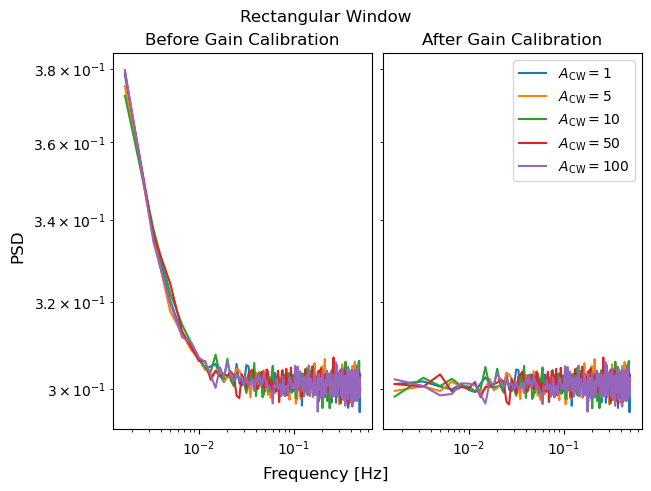

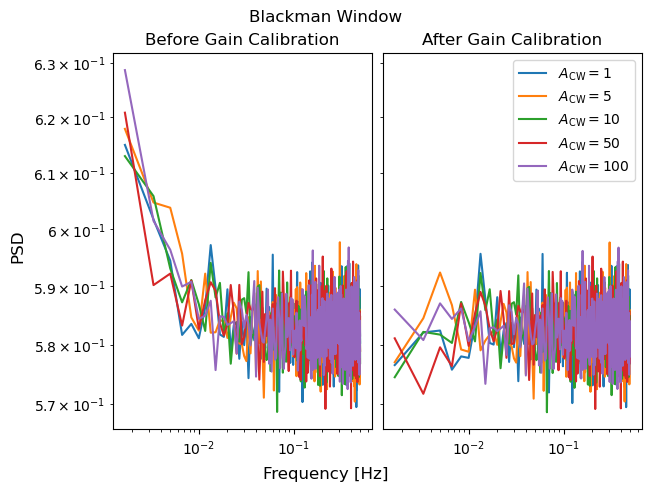

In [18]:
fig, axes = plt.subplots(layout='constrained', ncols=2, sharey=True)
for t, a_cw in zip(a_cws_tods_rectangular_window, a_cws):
    cal = CW_Calibrator(t.integrated_spectra, t.times, t.frequencies_mhz)
    _ = cal.otf_gain_calibration(method='Aperture', aperture_bounds=[4, 5])
    original_psd, gain_corrected_psd, fft_freqs = cal.compare_pink_noise_before_and_after(n_to_mask=5)
    axes[1].plot(fft_freqs[1:-1], gain_corrected_psd[1:-1], label=r'$A_{\rm CW} = $'+str(a_cw))
    axes[0].plot(fft_freqs[1:-1], original_psd[1:-1], label=r'$A_{\rm CW} = $'+str(a_cw))
fig.suptitle('Rectangular Window')
axes[0].set_title('Before Gain Calibration')
axes[1].set_title('After Gain Calibration')
axes[0].set_yscale('log')
axes[0].set_xscale('log')
axes[1].set_xscale('log')
fig.supylabel('PSD')
fig.supxlabel('Frequency [Hz]')
axes[1].legend()
plt.show()

fig, axes = plt.subplots(layout='constrained', ncols=2, sharey=True)
for t, a_cw in zip(a_cws_tods_blackman_window, a_cws):
    cal = CW_Calibrator(t.integrated_spectra, t.times, t.frequencies_mhz)
    _ = cal.otf_gain_calibration(method='Aperture', aperture_bounds=[4, 5])
    original_psd, gain_corrected_psd, fft_freqs = cal.compare_pink_noise_before_and_after(n_to_mask=5)
    axes[1].plot(fft_freqs[1:-1], gain_corrected_psd[1:-1], label=r'$A_{\rm CW} = $'+str(a_cw))
    axes[0].plot(fft_freqs[1:-1], original_psd[1:-1], label=r'$A_{\rm CW} = $'+str(a_cw))
fig.suptitle('Blackman Window')
axes[0].set_title('Before Gain Calibration')
axes[1].set_title('After Gain Calibration')
axes[0].set_yscale('log')
axes[0].set_xscale('log')
axes[1].set_xscale('log')
fig.supylabel('PSD')
fig.supxlabel('Frequency [Hz]')
axes[1].legend()
plt.show()

As the SNR is lower for the Blackman window, the detectability of the 1/f fluctuations is also reduced so that in the original spectum, the white noise level is already higher at the same temporal frequencies.

The calibration stratergy does not significantly change the white noise level for a CW only case.

Compare the RMS fluctuations on measurements of the gain.

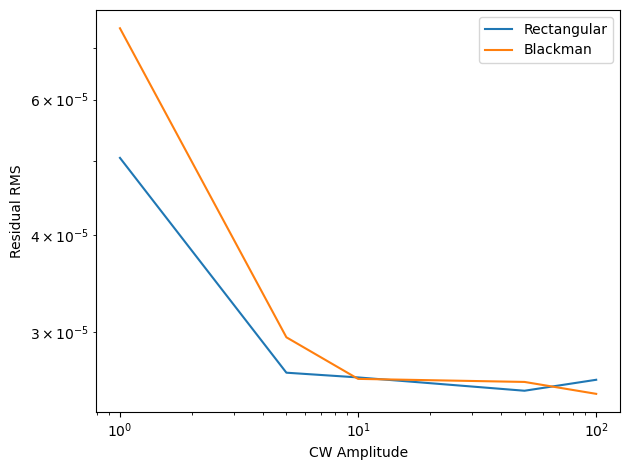

In [ ]:
rectangular_rms = []
for t, a_cw in zip(a_cws_tods_rectangular_window, a_cws):
    split_gains = np.array_split(t.receiver_gains, len(t.times))
    true_gains = np.array([np.mean(g) for g in split_gains])
    true_gains = true_gains / true_gains[0]
    cal = CW_Calibrator(spectra=t.integrated_spectra, times=t.times, frequencies=t.frequencies_mhz)
    _, measured_gains = cal.otf_gain_calibration('Aperture', aperture_bounds=[3, 5], return_measured_gains=True)
    residual = measured_gains-true_gains
    rectangular_rms.append(np.std(residual))
    
rectangular_rms = np.array(rectangular_rms)

plt.plot(a_cws, rectangular_rms, label='Rectangular')

blackman_rms = []
for t, a_cw in zip(a_cws_tods_blackman_window, a_cws):
    split_gains = np.array_split(t.receiver_gains, len(t.times))
    true_gains = np.array([np.mean(g) for g in split_gains])
    true_gains = true_gains / true_gains[0]
    cal = CW_Calibrator(spectra=t.integrated_spectra, times=t.times, frequencies=t.frequencies_mhz)
    _, measured_gains = cal.otf_gain_calibration('Aperture', aperture_bounds=[3, 5], return_measured_gains=True)
    residual = measured_gains-true_gains
    residual_rms = np.std(residual)
    blackman_rms.append(residual_rms)
    
blackman_rms = np.array(blackman_rms)

plt.plot(a_cws, blackman_rms, label='Blackman')

plt.ylabel('Residual RMS')
plt.legend()
plt.xlabel('CW Amplitude')
plt.xscale('log')
plt.yscale('log')
plt.tight_layout()
plt.show()

Comparing Setting for Aperture and Polynomial Fitting

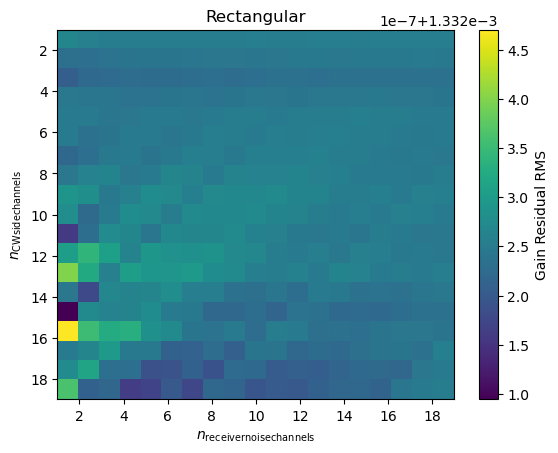

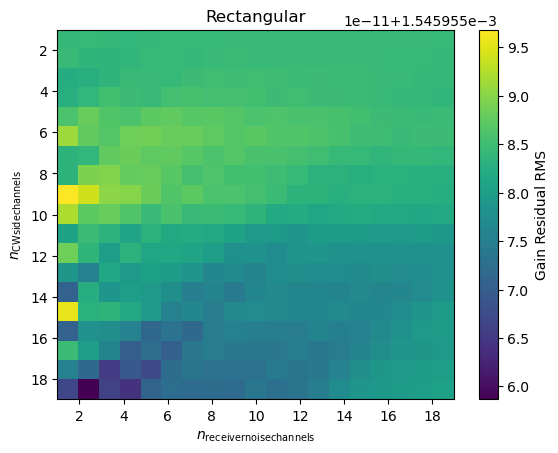

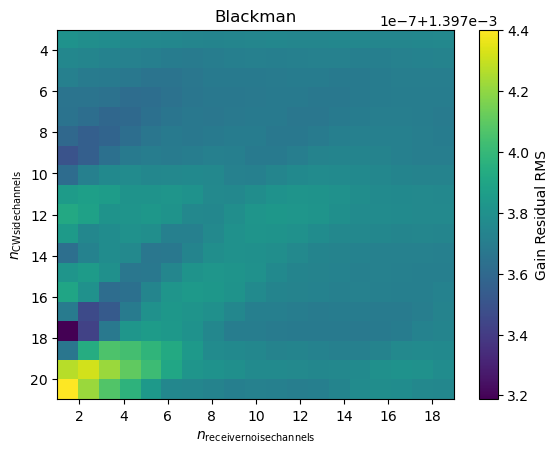

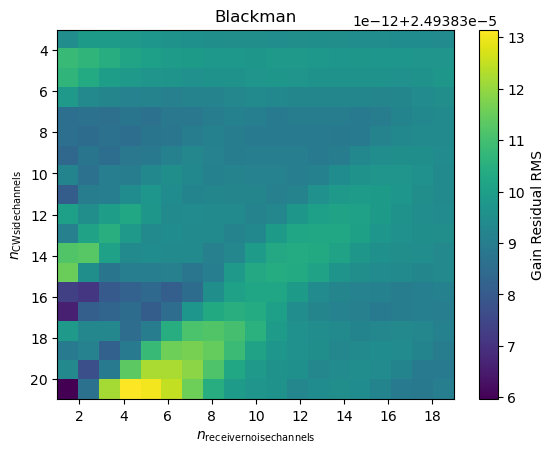

(19, 19) (19, 19) (19, 19) (19, 19)


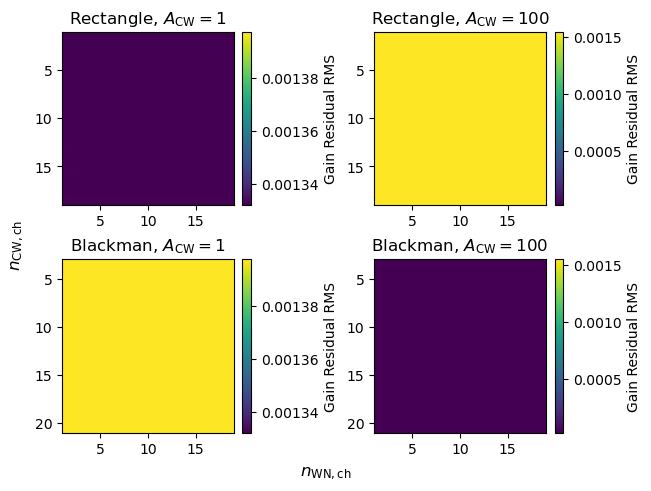

In [75]:
example_tod_rect = a_cws_tods_rectangular_window[0]
cw_side_channels_r = np.arange(start=1, stop=20)
non_cw_side_channels_r = np.arange(start=1, stop=20)

aperture_gain_residual_mapr0 = np.ones(shape=(len(cw_side_channels_r), len(non_cw_side_channels_r)))
for i, cw_side in enumerate(cw_side_channels_r):
    for j, non_cw_side in enumerate(non_cw_side_channels_r):
        plit_gains = np.array_split(example_tod_rect.receiver_gains, len(example_tod_rect.times))
        true_gains = np.array([np.mean(g) for g in split_gains])
        true_gains = true_gains / true_gains[0]
        cal = CW_Calibrator(spectra=example_tod_rect.integrated_spectra,
                            times=example_tod_rect.times,
                            frequencies=example_tod_rect.frequencies_mhz)
        _, measured_gains = cal.otf_gain_calibration('Aperture', aperture_bounds=[cw_side, non_cw_side], return_measured_gains=True)
        residual = measured_gains-true_gains
        residual_rms = np.std(residual[1:])
        aperture_gain_residual_mapr0[i, j] = residual_rms
extent_r = [non_cw_side_channels_r[0], non_cw_side_channels_r[-1], cw_side_channels_r[-1], cw_side_channels_r[0]]
fig, axes = plt.subplots()
ax1 = axes.imshow(aperture_gain_residual_mapr0, extent=extent_r, aspect='auto')
axes.set_ylabel(r'$n_{\rm CW side channels}$')
axes.set_xlabel(r'$n_{\rm receiver noise channels}$')
axes.set_title('Rectangular')
cbar = fig.colorbar(ax1, ax=axes, label='Gain Residual RMS')
plt.show()

example_tod_rect = a_cws_tods_rectangular_window[-1]

aperture_gain_residual_mapr1 = np.ones(shape=(len(cw_side_channels_r), len(non_cw_side_channels_r)))
for i, cw_side in enumerate(cw_side_channels_r):
    for j, non_cw_side in enumerate(non_cw_side_channels_r):
        plit_gains = np.array_split(example_tod_rect.receiver_gains, len(example_tod_rect.times))
        true_gains = np.array([np.mean(g) for g in split_gains])
        true_gains = true_gains / true_gains[0]
        cal = CW_Calibrator(spectra=example_tod_rect.integrated_spectra,
                            times=example_tod_rect.times,
                            frequencies=example_tod_rect.frequencies_mhz)
        _, measured_gains = cal.otf_gain_calibration('Aperture', aperture_bounds=[cw_side, non_cw_side], return_measured_gains=True)
        residual = measured_gains-true_gains
        residual_rms = np.std(residual[1:])
        aperture_gain_residual_mapr1[i, j] = residual_rms
extent_r = [non_cw_side_channels_r[0], non_cw_side_channels_r[-1], cw_side_channels_r[-1], cw_side_channels_r[0]]
fig, axes = plt.subplots()
ax1 = axes.imshow(aperture_gain_residual_mapr1, extent=extent_r, aspect='auto')
axes.set_ylabel(r'$n_{\rm CW side channels}$')
axes.set_xlabel(r'$n_{\rm receiver noise channels}$')
axes.set_title('Rectangular')
cbar = fig.colorbar(ax1, ax=axes, label='Gain Residual RMS')
plt.show()

##### Blackman

example_tod_blackman = a_cws_tods_blackman_window[0]
cw_side_channels_b = np.arange(start=3, stop=22)
non_cw_side_channels_b = np.arange(start=1, stop=20)

aperture_gain_residual_mapb0 = np.ones(shape=(len(cw_side_channels_b), len(non_cw_side_channels_b)))
for i, cw_side in enumerate(cw_side_channels_b):
    for j, non_cw_side in enumerate(non_cw_side_channels_b):
        plit_gains = np.array_split(example_tod_blackman.receiver_gains, len(example_tod_blackman.times))
        true_gains = np.array([np.mean(g) for g in split_gains])
        true_gains = true_gains / true_gains[0]
        cal = CW_Calibrator(spectra=example_tod_blackman.integrated_spectra,
                            times=example_tod_blackman.times,
                            frequencies=example_tod_blackman.frequencies_mhz)
        _, measured_gains = cal.otf_gain_calibration('Aperture', aperture_bounds=[cw_side, non_cw_side], return_measured_gains=True)
        residual = measured_gains-true_gains
        residual_rms = np.std(residual[1:])
        aperture_gain_residual_mapb0[i, j] = residual_rms
extent = [non_cw_side_channels_b[0], non_cw_side_channels_b[-1], cw_side_channels_b[-1], cw_side_channels_b[0]]

fig, axes = plt.subplots()
ax1 = axes.imshow(aperture_gain_residual_mapb0, extent=extent, aspect='auto')
axes.set_ylabel(r'$n_{\rm CW side channels}$')
axes.set_xlabel(r'$n_{\rm receiver noise channels}$')
axes.set_title('Blackman')
cbar = fig.colorbar(ax1, ax=axes, label='Gain Residual RMS')
plt.show()

example_tod_blackman = a_cws_tods_blackman_window[-1]
aperture_gain_residual_mapb1 = np.ones(shape=(len(cw_side_channels_b), len(non_cw_side_channels_b)))
for i, cw_side in enumerate(cw_side_channels_b):
    for j, non_cw_side in enumerate(non_cw_side_channels_b):
        plit_gains = np.array_split(example_tod_blackman.receiver_gains, len(example_tod_blackman.times))
        true_gains = np.array([np.mean(g) for g in split_gains])
        true_gains = true_gains / true_gains[0]
        cal = CW_Calibrator(spectra=example_tod_blackman.integrated_spectra,
                            times=example_tod_blackman.times,
                            frequencies=example_tod_blackman.frequencies_mhz)
        _, measured_gains = cal.otf_gain_calibration('Aperture', aperture_bounds=[cw_side, non_cw_side], return_measured_gains=True)
        residual = measured_gains-true_gains
        residual_rms = np.std(residual[1:])
        aperture_gain_residual_mapb1[i, j] = residual_rms
extent_b = [non_cw_side_channels_b[0], non_cw_side_channels_b[-1], cw_side_channels_b[-1], cw_side_channels_b[0]]

fig, axes = plt.subplots()
ax1 = axes.imshow(aperture_gain_residual_mapb1, extent=extent_b, aspect='auto')
axes.set_ylabel(r'$n_{\rm CW side channels}$')
axes.set_xlabel(r'$n_{\rm receiver noise channels}$')
axes.set_title('Blackman')
cbar = fig.colorbar(ax1, ax=axes, label='Gain Residual RMS')
plt.show()

print(aperture_gain_residual_mapb0.shape, aperture_gain_residual_mapb1.shape,
      aperture_gain_residual_mapr0.shape, aperture_gain_residual_mapr1.shape)

#aperture_gain_residual_mapb0 = np.log10(aperture_gain_residual_mapb0)
#aperture_gain_residual_mapb1 = np.log10(aperture_gain_residual_mapb1)
#aperture_gain_residual_mapr0 = np.log10(aperture_gain_residual_mapr0)
#aperture_gain_residual_mapr1 = np.log10(aperture_gain_residual_mapr1)


comb0 = np.array([aperture_gain_residual_mapr0, aperture_gain_residual_mapb0])
comb1 = np.array([aperture_gain_residual_mapr1, aperture_gain_residual_mapb1])
vmin0, vmax0 = np.min(comb0), np.max(comb0)
vmin1, vmax1 = np.min(comb1), np.max(comb1)


fig, axes = plt.subplots(nrows=2, ncols=2, layout='constrained')
ax1 = axes[0,0].imshow(aperture_gain_residual_mapr0, extent=extent_r, aspect='auto', vmin=vmin0, vmax=vmax0)
axes[0,0].set_title(r'Rectangle, $A_{\rm CW} = $'+str(a_cws[0]))
ax2 = axes[0,1].imshow(aperture_gain_residual_mapr1, extent=extent_r, aspect='auto', vmin=vmin1, vmax=vmax1)
axes[0,1].set_title(r'Rectangle, $A_{\rm CW} = $'+str(a_cws[-1]))
ax3 = axes[1,0].imshow(aperture_gain_residual_mapb0, extent=extent_b, aspect='auto', vmin=vmin0, vmax=vmax0)
axes[1,0].set_title(r'Blackman, $A_{\rm CW} = $'+str(a_cws[0]))
ax4 = axes[1,1].imshow(aperture_gain_residual_mapb1, extent=extent_b, aspect='auto', vmin=vmin1, vmax=vmax1)
axes[1,1].set_title(r'Blackman, $A_{\rm CW} = $'+str(a_cws[-1]))
fig.supylabel(r'$n_{\rm CW, ch}$')
fig.supxlabel(r'$n_{\rm WN, ch}$')
ax_list = [axes[i,j] for i in range(2) for j in range(2)]


cbar1 = fig.colorbar(ax1, ax=axes[0,0], label='Gain Residual RMS')
cbar2 = fig.colorbar(ax2, ax=axes[0,1], label='Gain Residual RMS')
cbar3 = fig.colorbar(ax3, ax=axes[1,0], label='Gain Residual RMS')
cbar4 = fig.colorbar(ax4, ax=axes[1,1], label='Gain Residual RMS')
plt.show()

Generating a set of data with the same parameters but with varying CW locations with a open ended long cable.

This will allow comparison between the polynomial fitting route and the simple aperture case.

   generating data


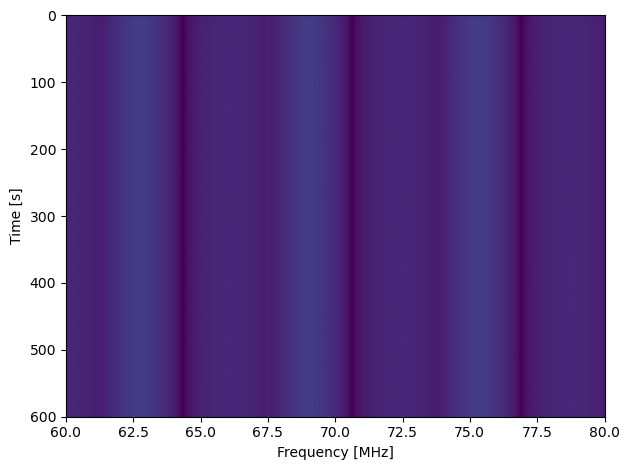

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


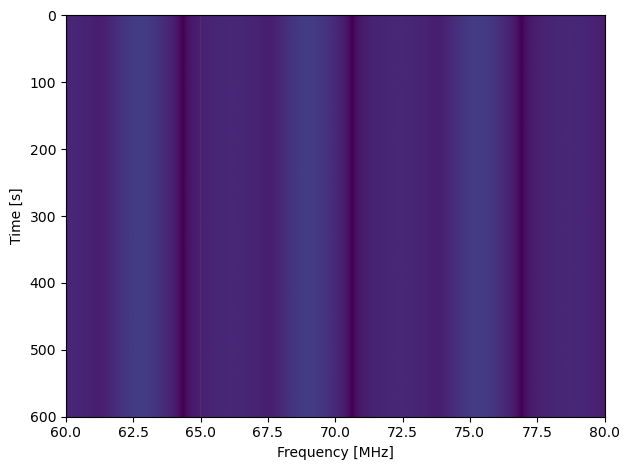

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


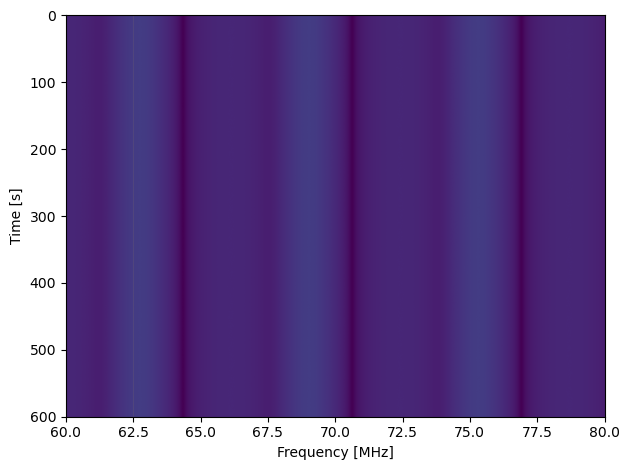

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


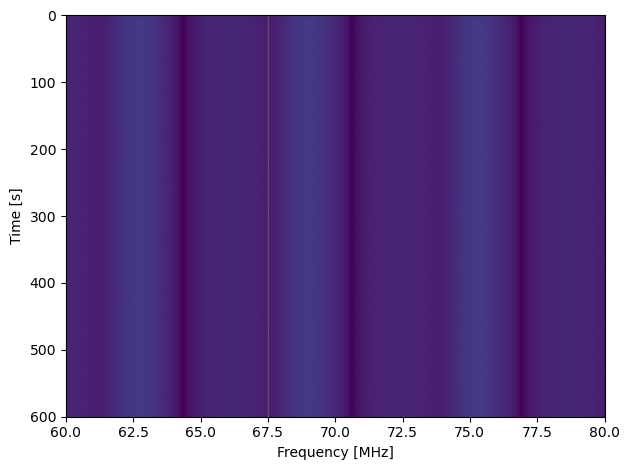

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


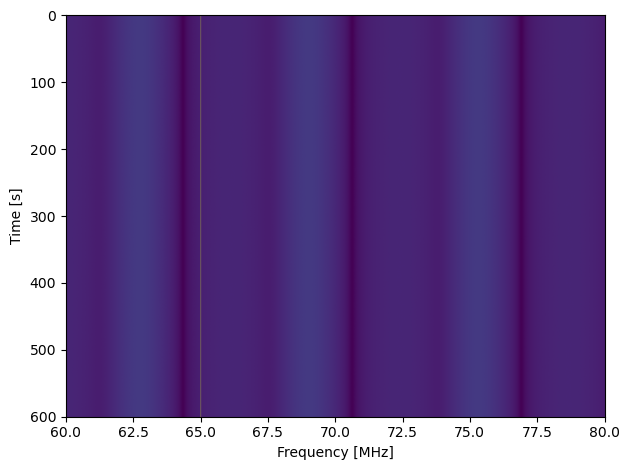

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
   generating data


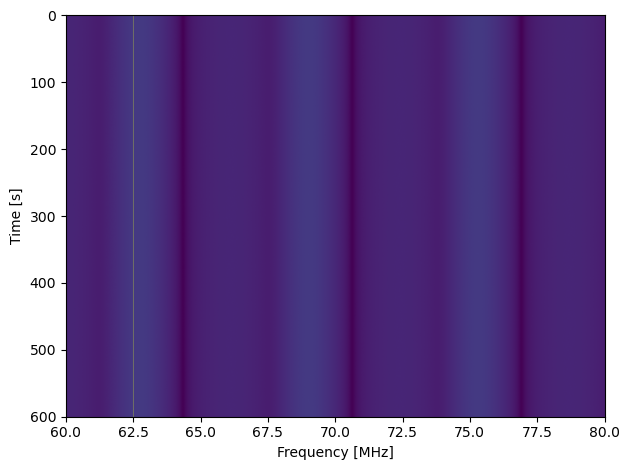

----====----
(1464842,)  - system gains
(1464842,)  - cw amplitudes
600.0  - n_integrations
1464843  - nframes
(600, 8192)  - integrated spectra
done


In [3]:
nu_cws_mhz = [62.5, 65, 67.5]

receiver = charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function='Rectangular',
                                beta=0)
target = charger.TerminatedCable(physical_temperature=300, frequencies=receiver.frequencies, termination='Open',
                                 epsilon=1.5, cable_length=100)
cw_sources = [charger.CW_Source(initial_cw_amplitude=100, oscilator_frequency=nu_mhz*10**6, characteristic_frequency=0.1, alpha=2, 
                                phase_white_noise=1e-9, phase_knee_frequency=1e-9, phase_alpha=0) for nu_mhz in nu_cws_mhz]
save_path_rect = 'Test_Data/Polynomial_Test/Rectangular/'
h5py_titles = [f'PolyTest_{n}.hd5f' for n in nu_cws_mhz]

shorted_cable_tods_rectangular = []
for cw_source, title in zip(cw_sources, h5py_titles):
    t = charger.TimeStreamGenerator(integration_time=1, simulation_time=600, #change to 600
                                    bandwidth=receiver.sample_rate,
                                    centre_frequency=receiver.centre_frequency,
                                    n_freq_channels=receiver.n_freq_channels)
    t.generate_simulated_data(obs_source=target, cw_source=cw_source, receiver=receiver,
                              save_data=True, savepath=save_path_rect, title=title, save_into_object=True, plot_spectra=True)
    shorted_cable_tods_rectangular.append(t)

nu_cws_mhz = [62.5, 65, 67.5]

receiver = charger.SDR_Receiver(characteristic_frequency=100, alpha=2, centre_frequency=70e6,
                                n_freq_channels=2**13, sample_rate=20e6,
                                t_unc=250, t_cos=190, t_sin=90, t_n=300,
                                reflection_coefficients=0.5, window_function='Blackman',
                                beta=0)
target = charger.TerminatedCable(physical_temperature=300, frequencies=receiver.frequencies, termination='Open',
                                 epsilon=1.5, cable_length=100)
cw_sources = [charger.CW_Source(initial_cw_amplitude=100, oscilator_frequency=nu_mhz*10**6, characteristic_frequency=0.1, alpha=2, 
                                phase_white_noise=1e-9, phase_knee_frequency=1e-9, phase_alpha=0) for nu_mhz in nu_cws_mhz]

save_path_black = 'Test_Data/Polynomial_Test/Blackman/'
h5py_titles = [f'PolyTest_{n}.hd5f' for n in nu_cws_mhz]

shorted_cable_tods_blackman = []
for cw_source, title in zip(cw_sources, h5py_titles):
    t = charger.TimeStreamGenerator(integration_time=1, simulation_time=600, #change to 600
                                    bandwidth=receiver.sample_rate,
                                    centre_frequency=receiver.centre_frequency,
                                    n_freq_channels=receiver.n_freq_channels)
    t.generate_simulated_data(obs_source=target, cw_source=cw_source, receiver=receiver,
                              save_data=True, savepath=save_path_black, title=title, save_into_object=True, plot_spectra=True)
    shorted_cable_tods_blackman.append(t)

print('done')

No Switching
No Powermeter Measurement


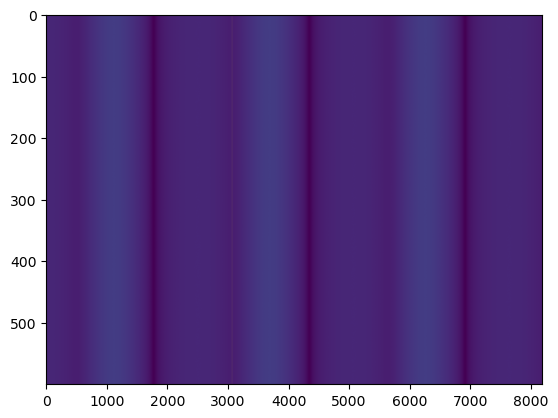

In [5]:
test_tod = charger.TimeStreamGenerator()
test_tod.read_in_from_h5py('Test_Data/Polynomial_Test/Rectangular/PolyTest_62.5.hd5f')

plt.imshow(10*np.log10(test_tod.integrated_spectra), aspect='auto')
plt.show()